# Udacity Project #3: Investigating Dataset(s) from the WeRateDogs Twitter account @dog_rates.

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id="wrangling"></a>
### Data Wrangling

#### Step 1: Gathering data
Three datasets are gathered and assessed in this project.

1) tweet_json.txt (I never received any response from Twitter to my multiple requests for a Twitter API key, and so I had to download tweet_json.txt from the Udacity website.) - saved and copied as DataFrame tweets_clean. 

2) image_predictions.tsv (downloaded programmatically using the Requests library from Udacity’s servers) – saved and copied as DataFrame image_pred_clean.

3) twitter_archive_enhanced.csv (downloaded from Udacity) – saved and copied as DataFrame twit_archive_clean.

In [1]:
#import the libraries I'll need
import pandas as pd
import numpy as np
import requests
import json
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
#setting pandas display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

#### Loading the dataset from Twitter with(out) a Twitter API key

I was unable to get a Twitter API key even though I have a Twiter account; Twitter never responded to my requests.  I ended up following directions for accessing the Twitter data without actually creating a Twitter account and downloaded two files provided by Udacity:

   twitter_api.py: This is the Twitter API code to gather some of the required data for the project. Read the code and comments, understand how the code works, then copy and paste it into your notebook.

   tweet_json.txt: This is the resulting data from twitter_api.py. You can proceed with the following part of "Gathering Data for this Project" on the Project Details page: "Then read this tweet_json.txt file line by line into a pandas DataFrame with (at minimum) tweet ID, retweet count, and favorite count."


#### Loading the Twitter data, tweet_json.txt

In [3]:
# This is the code that would have been used if I had gotten a Twitter API key
# import tweepy
# from tweepy import OAuthHandler
# import json
# from timeit import default_timer as timer

# # Query Twitter API for each tweet in the Twitter archive and save JSON in a text file
# # These are hidden to comply with Twitter's API terms and conditions
# consumer_key = 'HIDDEN'
# consumer_secret = 'HIDDEN'
# access_token = 'HIDDEN'
# access_secret = 'HIDDEN'

# auth = OAuthHandler(consumer_key, consumer_secret)
# auth.set_access_token(access_token, access_secret)

# api = tweepy.API(auth, wait_on_rate_limit=True)

# NOTE TO STUDENT WITH MOBILE VERIFICATION ISSUES:
# df_1 is a DataFrame with the twitter_archive_enhanced.csv file. You may have to
# change line 17 to match the name of your DataFrame with twitter_archive_enhanced.csv
# NOTE TO REVIEWER: this student had mobile verification issues so the following
# Twitter API code was sent to this student from a Udacity instructor

# Tweet IDs for which to gather additional data via Twitter's API
# tweet_ids = df_1.tweet_id.values
# len(tweet_ids)

# # Query Twitter's API for JSON data for each tweet ID in the Twitter archive
# count = 0
# fails_dict = {}
# start = timer()
# # Save each tweet's returned JSON as a new line in a .txt file
# with open('tweet_json.txt', 'w') as outfile:
#     # This loop will likely take 20-30 minutes to run because of Twitter's rate limit
#     for tweet_id in tweet_ids:
#         count += 1
#         print(str(count) + ": " + str(tweet_id))
#         try:
#             tweet = api.get_status(tweet_id, tweet_mode='extended')
#             print("Success")
#             json.dump(tweet._json, outfile)
#             outfile.write('\n')
#         except tweepy.TweepError as e:
#             print("Fail")
#             fails_dict[tweet_id] = e
#             pass
# end = timer()
# print(end - start)
# print(fails_dict)

In [4]:
#Instead of using a Twitter API, I downloaded the file tweet-json.txt from the Udacity website
#read this .txt file line by line into a pandas DataFrame with (at minimum) tweet ID, retweet count, and favorite count.    
tweets = []
for line in open('tweet-json.txt', 'r'):
    tweets.append(json.loads(line))

In [5]:
tweets = pd.DataFrame(tweets) #create a DataFrame

In [6]:
tweets_clean = tweets.copy() #make a working copy of the DataFrame

#### Loading the image prediction dataset, image_predictions.tsv

In [7]:
#this is the url for the image prediction dataset
url = "https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv"

In [8]:
#use requests to get and download the file from the url
r = requests.get(url)
r.raise_for_status()
filename = "image_predictions.tsv"
with open(filename, 'wb') as f:
        f.write(r.content)

In [9]:
image_pred = pd.read_csv("image_predictions.tsv", sep="\t") #read the file into a DataFrame

In [10]:
image_pred_clean = image_pred.copy() #make a working copy of the DataFrame

#### Loading Twitter archive data, twitter-archive-enhanced.csv

In [11]:
twit_archive = pd.read_csv("twitter-archive-enhanced.csv") #loading twitter archive data into a DataFrame

In [12]:
twit_archive_clean = twit_archive.copy() #make a working copy of the DataFrame

#### Step 2: Assessing the data

##### Assessing the DataFrame tweets_clean

In [13]:
tweets_clean.info() #apply info() to the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   created_at                     2354 non-null   object 
 1   id                             2354 non-null   int64  
 2   id_str                         2354 non-null   object 
 3   full_text                      2354 non-null   object 
 4   truncated                      2354 non-null   bool   
 5   display_text_range             2354 non-null   object 
 6   entities                       2354 non-null   object 
 7   extended_entities              2073 non-null   object 
 8   source                         2354 non-null   object 
 9   in_reply_to_status_id          78 non-null     float64
 10  in_reply_to_status_id_str      78 non-null     object 
 11  in_reply_to_user_id            78 non-null     float64
 12  in_reply_to_user_id_str        78 non-null     o

#### There are a number of columns that are null values ("geo", "coordinates", "contributors" or almost all null values ("place", "quoted_status_...", "in_reply_to_...")

In [14]:
tweets_clean.head() #examine first five rows

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,Tue Aug 01 16:23:56 +0000 2017,892420643555336193,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]}","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,None,NaN,None,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3200889, 'friends_count': 104, 'listed_count': 2784, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5288, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1501129017', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': True, 'default_profile': False, 'default_profile_image': False, 'following': True, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",None,None,None,None,False,8853,39467,False,False,False,False,en,NaN,NaN,NaN,NaN
1,Tue Aug 01 00:17:27 +0000 2017,892177421306343426,89

In [15]:
tweets_clean.tail() #examine last five rows

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
2349,Mon Nov 16 00:24:50 +0000 2015,666049248165822465,666049248165822465,Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,False,"[0, 120]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 666049244999131136, 'id_str': '666049244999131136', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg', 'url': 'https://t.co/4B7cOc1EDq', 'display_url': 'pic.twitter.com/4B7cOc1EDq', 'expanded_url': 'https://twitter.com/dog_rates/status/666049248165822465/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 340, 'h': 453, 'resize': 'fit'}}}]}","{'media': [{'id': 666049244999131136, 'id_str': '666049244999131136', 'indices': [97, 120], 'media_url': 'http://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg', 'url': 'https://t.co/4B7cOc1EDq', 'display_url': 'pic.twitter.com/4B7cOc1EDq', 'expanded_url': 'https://twitter.com/dog_rates/status/666049248165822465/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 600, 'h': 800, 'resize': 'fit'}, 'large': {'w': 768, 'h': 1024, 'resize': 'fit'}, 'small': {'w': 340, 'h': 453, 'resize': 'fit'}}}]}","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,None,NaN,None,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3201018, 'friends_count': 104, 'listed_count': 2812, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5288, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1501129017', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': True, 'default_profile': False, 'default_profile_image': False, 'following': True, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",None,None,None,None,False,41,111,False,False,False,False,en,NaN,NaN,NaN,NaN
2350,Mon Nov 16 00:04:52 +0000 2015,66604

#### "entities," "extended_entities" and "user" have redundant data that appears in other columns. "full_text" contains both the text of the tweet and a shortened URL to that tweet. "truncated,"  "display_text_range" and "source" don't appear to contain information useful to our analysis. Also, "id" and "id_str" appear to be the same values.

In [16]:
#checking if "id" and "id_str" are the same values if they are the same format
tweets_clean[tweets_clean["id"].astype(str)!=tweets_clean["id_str"]]

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status


#### "id" and "id_str" are the same values if they are the same format

In [17]:
#checking if tweet "id" has any duplicates
tweets_clean[tweets_clean["id"].duplicated()]

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status


#### No duplicate "id"

In [18]:
#examine "in_reply_to_status_id" 
tweets_clean[tweets_clean["in_reply_to_status_id"].notnull()].head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
29,Sat Jul 15 16:51:35 +0000 2017,886267009285017600,886267009285017600,@NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution,False,"[27, 105]","{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'NonWhiteHat', 'name': 'Patrick Nonwhite', 'id': 2281181600, 'id_str': '2281181600', 'indices': [0, 12]}, {'screen_name': 'MayhewMayhem', 'name': 'Мейхью Мейхем', 'id': 38308544, 'id_str': '38308544', 'indices': [13, 26]}], 'urls': []}",NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",8.862664e+17,886266357075128321,2.281182e+09,2281181600,NonWhiteHat,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3200890, 'friends_count': 104, 'listed_count': 2784, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5288, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1501129017', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': True, 'default_profile': False, 'default_profile_image': False, 'following': True, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",None,None,None,None,False,4,117,False,False,NaN,NaN,en,NaN,NaN,NaN,NaN
54,Sun Jul 02 21:58:53 +0000 2017,881633300179243008,881633300179243008,@roushfenway These are good dogs but 17/10 is an emotional impulse rating. More like 13/10s,False,"[13, 91]","{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'roushfenway', 'name': 'Roush Fenway Racing', 'id': 47384430, 'id_str': '47384430', 'indices': [0, 12]}], 'urls': []}",NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",8.816070e+17,881607037314052101,4.738443e+07,47384430,roushfenway,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': '

#### This doesn't appear very helpful as it appears to be the id values for replies to tweets.

In [19]:
#examine "in_reply_to_user_id_str"
tweets_clean[tweets_clean["in_reply_to_user_id_str"].notnull()].head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
29,Sat Jul 15 16:51:35 +0000 2017,886267009285017600,886267009285017600,@NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution,False,"[27, 105]","{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'NonWhiteHat', 'name': 'Patrick Nonwhite', 'id': 2281181600, 'id_str': '2281181600', 'indices': [0, 12]}, {'screen_name': 'MayhewMayhem', 'name': 'Мейхью Мейхем', 'id': 38308544, 'id_str': '38308544', 'indices': [13, 26]}], 'urls': []}",NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",8.862664e+17,886266357075128321,2.281182e+09,2281181600,NonWhiteHat,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3200890, 'friends_count': 104, 'listed_count': 2784, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5288, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1501129017', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': True, 'default_profile': False, 'default_profile_image': False, 'following': True, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",None,None,None,None,False,4,117,False,False,NaN,NaN,en,NaN,NaN,NaN,NaN
54,Sun Jul 02 21:58:53 +0000 2017,881633300179243008,881633300179243008,@roushfenway These are good dogs but 17/10 is an emotional impulse rating. More like 13/10s,False,"[13, 91]","{'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'roushfenway', 'name': 'Roush Fenway Racing', 'id': 47384430, 'id_str': '47384430', 'indices': [0, 12]}], 'urls': []}",NaN,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",8.816070e+17,881607037314052101,4.738443e+07,47384430,roushfenway,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': '

In [20]:
#doesn't appear to be userful, is id of some type

In [21]:
#examine "in_reply_to_screen_name"
tweets_clean["in_reply_to_screen_name"].value_counts()

dog_rates          47
markhoppus          2
SkyWilliams         1
s8n                 1
shibbnbot           1
Jack_Septic_Eye     1
dhmontgomery        1
TheEllenShow        1
docmisterio         1
NBCSports           1
CommonWhiteGirI     1
JODYHiGHROLLER      1
RealKentMurphy      1
Marc_IRL            1
HistoryInPics       1
mount_alex3         1
0_kelvin_0          1
serial              1
NonWhiteHat         1
ABC7                1
roushfenway         1
jonnysun            1
imgur               1
wane15              1
LightningHoltt      1
spaghemily          1
ComplicitOwl        1
ABC                 1
xianmcguire         1
UNC                 1
bragg6of8           1
Name: in_reply_to_screen_name, dtype: int64

#### Doesn't appear useful for our analysis.

In [22]:
tweets_clean[tweets_clean["is_quote_status"]==True].head()

created_at                  id              id_str  \
31  Sat Jul 15 02:45:48 +0000 2017  886054160059072513  886054160059072513   
34  Thu Jul 13 15:19:09 +0000 2017  885518971528720385  885518971528720385   
41  Mon Jul 10 03:08:17 +0000 2017  884247878851493888  884247878851493888   
71  Sat Jun 24 13:24:20 +0000 2017  878604707211726852  878604707211726852   
82  Sun Jun 18 20:30:39 +0000 2017  876537666061221889  876537666061221889   

                                                                                                                                        full_text  \
31                                                                                             RT @Athletics: 12/10 #BATP https://t.co/WxwJmvjfxo   
34                                                                        I have a new hero and his name is Howard. 14/10 https://t.co/gzLHboL7Sk   
41               OMG HE DIDN'T MEAN TO HE WAS JUST TRYING A LITTLE BARKOUR HE'S SUPER SORRY 13/10 WOULD FORGIVE IMMEDIATE https://t.co/uF3pQ8Wubj   
71                                                                          Martha is stunning how h*ckin dare you. 13/10 https://t.co/9uABQXgjwa   
82  I can say with the pupmost confidence that the doggos who assisted with this search are heroic as h*ck. 14/10 for all https://t.co/8yoc1CNTsu   

    truncated display_text_range  \
31      False            [0, 50]   
34      False            [0, 47]   
41      False           [0, 104]   
71      False            [0, 45]   
82      False           [0, 117]   

                                                                                                                                                                                                                                                                                                                                                                                                   entities  \
31  {'hashtags': [{'text': 'BATP', 'indices': [21, 26]}], 'symbols': [], 'user_mentions': [{'screen_name': 'Athletics', 'name': 'Oakland A's 🌳🐘⚾️', 'id': 19607400, 'id_str': '19607400', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/WxwJmvjfxo', 'expanded_url': 'https://twitter.com/dog_rates/status/886053434075471873', 'display_url': 'twitter.com/dog_rates/stat…', 'indices': [27, 50]}]}   
34                                                                                                                                                     {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/gzLHboL7Sk', 'expanded_url': 'https://twitter.com/4bonds2carbon/status/885517367337512960', 'display_url': 'twitter.com/4bonds2carbon/…', 'indices': [48, 71]}]}   
41                                                                                                                                                   {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/uF3pQ8Wubj', 'expanded_url': 'https://twitter.com/kaijohnson_19/status/883965650754039809', 'display_url': 'twitter.com/kaijohnson_19/…', 'indices': [105, 128]}]}   
71                                                                                                                                                          {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/9uABQXgjwa', 'expanded_url': 'https://twitter.com/bbcworld/status/878599868507402241', 'display_url': 'twitter.com/bbcworld/statu…', 'indices': [46, 69]}]}   
82                                                                                                                                                     {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/8yoc1CNTsu', 'expanded_url': 'https://twitter.com/mpstowerham/status/876162994446753793', 'display_url': 'twitter.com/mpstowerham/st…', 'indices': [118, 141]}]}   

   extended_entities  \
31               NaN   


#### These rows appear to be quote tweets. Quote tweets are similar to retweets, but according to howtogeek.com, your followers will see whatever comment you type with the original tweet embedded. Any interactions on the tweet—like likes and comments—will be associated with your quote tweet rather than the original tweet. Since we want to track likes (favorites), we will not delete these quote tweets.

In [23]:
#let's take a look at "display_text_range"
len(tweets_clean.loc[0, "display_text_range"])

2

In [24]:
#that is strange, that the len of [0, 85 ] is 2.  Is it a list?
type(tweets_clean["display_text_range"][0])

list

##### "display_text_range" is a list showing the range of characters in the tweet text. But this information could be easily be generated from the text column. It will be deleted.

In [25]:
#examine "truncated"
tweets_clean["truncated"].value_counts()

False    2354
Name: truncated, dtype: int64

#### The values for "truncated" are all False and could be deleted.

In [26]:
#examine "source"
tweets_clean["source"].value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2219
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

#### The values for "source" can be deleted as almost all are from Twitter for iPhone and we don't intend to look at the source of  tweets.

In [27]:
#examine "favorited"
tweets_clean["favorited"].value_counts()

False    2346
True        8
Name: favorited, dtype: int64

#### Given that we have values for "favorite_count", "favorited" doesn't seem very helpful or accurate

In [28]:
#examine "retweeted"
tweets_clean["retweeted"].value_counts()

False    2354
Name: retweeted, dtype: int64

#### Given that we have values for "retweet_count", "retweeted" doesn't seem very helpful or accurate

In [29]:
#examine "retweeted_status"
tweets_clean[tweets_clean["retweeted_status"].notnull()]

created_at                  id              id_str  \
31    Sat Jul 15 02:45:48 +0000 2017  886054160059072513  886054160059072513   
35    Thu Jul 13 01:35:06 +0000 2017  885311592912609280  885311592912609280   
67    Mon Jun 26 00:13:58 +0000 2017  879130579576475649  879130579576475649   
72    Sat Jun 24 00:09:53 +0000 2017  878404777348136964  878404777348136964   
73    Fri Jun 23 18:17:33 +0000 2017  878316110768087041  878316110768087041   
77    Wed Jun 21 19:36:23 +0000 2017  877611172832227328  877611172832227328   
90    Tue Jun 13 01:14:41 +0000 2017  874434818259525634  874434818259525634   
94    Sun Jun 11 00:25:14 +0000 2017  873697596434513921  873697596434513921   
96    Sat Jun 10 00:35:19 +0000 2017  873337748698140672  873337748698140672   
100   Thu Jun 08 04:17:07 +0000 2017  872668790621863937  872668790621863937   
108   Sun Jun 04 00:46:17 +0000 2017  871166179821445120  871166179821445120   
117   Wed May 31 18:47:24 +0000 2017  869988702071779329  869988702071779329   
123   Sun May 28 01:26:04 +0000 2017  868639477480148993  868639477480148993   
129   Tue May 23 17:40:04 +0000 2017  867072653475098625  867072653475098625   
131   Tue May 23 00:41:20 +0000 2017  866816280283807744  866816280283807744   
136   Sun May 21 00:53:21 +0000 2017  866094527597207552  866094527597207552   
145   Sat May 13 19:11:30 +0000 2017  863471782782697472  863471782782697472   
154   Tue May 09 02:29:07 +0000 2017  861769973181624320  861769973181624320   
158   Sat May 06 22:16:42 +0000 2017  860981674716409858  860981674716409858   
159   Sat May 06 18:27:40 +0000 2017  860924035999428608  860924035999428608   
164   Thu May 04 17:01:34 +0000 2017  860177593139703809  860177593139703809   
170   Mon May 01 01:47:28 +0000 2017  858860390427611136  858860390427611136   
179   Wed Apr 26 02:41:43 +0000 2017  857062103051644929  857062103051644929   
181   Mon Apr 24 20:17:23 +0000 2017  856602993587888130  856602993587888130   
184   Mon Apr 24 02:15:55 +0000 2017  856330835276025856  856330835276025856   
193   Fri Apr 21 02:22:29 +0000 2017  855245323840757760  855245323840757760   
194   Thu Apr 20 19:16:59 +0000 2017  855138241867124737  855138241867124737   
203   Fri Apr 14 17:27:40 +0000 2017  852936405516943360  852936405516943360   
210   Wed Apr 12 00:23:33 +0000 2017  851953902622658560  851953902622658560   
211   Tue Apr 11 18:15:55 +0000 2017  851861385021730816  851861385021730816   
221   Wed Apr 05 17:00:34 +0000 2017  849668094696017920  849668094696017920   
229   Sat Apr 01 01:08:10 +0000 2017  847978865427394560  847978865427394560   
230   Sat Apr 01 00:39:12 +0000 2017  847971574464610304  847971574464610304   
246   Sat Mar 25 02:15:26 +0000 2017  845459076796616705  845459076796616705   
249   Fri Mar 24 02:22:04 +0000 2017  845098359547420673  845098359547420673   
259   Sat Mar 18 00:15:37 +0000 2017  842892208864923648  842892208864923648   
265   Wed Mar 15 02:10:39 +0000 2017  841833993020538882  841833993020538882   
271   Sun Mar 12 03:07:56 +0000 2017  840761248237133825  840761248237133825   
272   Sun Mar 12 00:59:17 +0000 2017  840728873075638272  840728873075638272   
280   Wed Mar 08 01:44:07 +0000 2017  839290600511926273  839290600511926273   
284   Tue Mar 07 00:57:32 +0000 2017  838916489579200512  838916489579200512   
285   Mon Mar 06 19:21:35 +0000 2017  838831947270979586  838831947270979586   
288   Sun Mar 05 01:36:26 +0000 2017  838201503651401729  838201503651401729   
297   Wed Mar 01 18:52:06 +0000 2017  837012587749474308  837012587749474308   
301   Tue Feb 28 18:46:45 +0000 2017  836648853927522308  836648853927522308   
302   Tue Feb 28 02:09:08 +0000 2017  836397794269200385  836397794269200385   
306   Sun Feb 26 02:57:52 +0000 2017  835685285446955009  835685285446955009   
308   Sat Feb 25 17:06:32 +0000 2017  835536468978302976  835536468978302976   
309   Sat Feb 25 02:03:02 +0000 2017  835309094223372289  835309094223372289   
318   Wed Feb 22 18:59:48 

#### These rows with non-null values for "retweeted_status" should be removed because we are not analyzing retweets

In [30]:
#examine "place"
tweets_clean[tweets_clean["place"].notnull()] #not useful.

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
857,Wed Aug 10 01:23:03 +0000 2016,763183847194451968,763183847194451968,This is Clark. He collects teddy bears. It's absolutely h*ckin horrifying. 8/10 please stop this Clark https://t.co/EDMcwt86fU,False,"[0, 102]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 763183833575481344, 'id_str': '763183833575481344', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CpdfpzKWYAAWSUi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpdfpzKWYAAWSUi.jpg', 'url': 'https://t.co/EDMcwt86fU', 'display_url': 'pic.twitter.com/EDMcwt86fU', 'expanded_url': 'https://twitter.com/dog_rates/status/763183847194451968/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}}}]}","{'media': [{'id': 763183833575481344, 'id_str': '763183833575481344', 'indices': [103, 126], 'media_url': 'http://pbs.twimg.com/media/CpdfpzKWYAAWSUi.jpg', 'media_url_https': 'https://pbs.twimg.com/media/CpdfpzKWYAAWSUi.jpg', 'url': 'https://t.co/EDMcwt86fU', 'display_url': 'pic.twitter.com/EDMcwt86fU', 'expanded_url': 'https://twitter.com/dog_rates/status/763183847194451968/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1024, 'h': 768, 'resize': 'fit'}, 'small': {'w': 680, 'h': 510, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1024, 'h': 768, 'resize': 'fit'}}}]}","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,None,NaN,None,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame | Business: dogratingtwitter@gmail.com', 'url': 'https://t.co/N7sNNHAEXS', 'entities': {'url': {'urls': [{'url': 'https://t.co/N7sNNHAEXS', 'expanded_url': 'http://weratedogs.com', 'display_url': 'weratedogs.com', 'indices': [0, 23]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 3200907, 'friends_count': 104, 'listed_count': 2789, 'created_at': 'Sun Nov 15 21:41:29 +0000 2015', 'favourites_count': 114031, 'utc_offset': None, 'time_zone': None, 'geo_enabled': True, 'verified': True, 'statuses_count': 5288, 'lang': 'en', 'contributors_enabled': False, 'is_translator': False, 'is_translation_enabled': False, 'profile_background_color': '000000', 'profile_background_image_url': 'http://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_image_url_https': 'https://abs.twimg.com/images/themes/theme1/bg.png', 'profile_background_tile': False, 'profile_image_url': 'http://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_image_url_https': 'https://pbs.twimg.com/profile_images/861415328504569856/R2xOOfwe_normal.jpg', 'profile_banner_url': 'https://pbs.twimg.com/profile_banners/4196983835/1501129017', 'profile_link_color': 'F5ABB5', 'profile_sidebar_border_color': '000000', 'profile_sidebar_fill_color': '000000', 'profile_text_color': '000000', 'profile_use_background_image': False, 'has_extended_profile': True, 'default_profile': False, 'default_profile_image': False, 'following': True, 'follow_request_sent': False, 'notifications': False, 'translator_type': 'none'}",None,None,"{'id': '7356b662670b2c31', 'url': 'https://api.twitter.com/1.1/geo/id/7356b662670b2c31.json', 'pl

In [31]:
#examine "lang"
tweets_clean["lang"].value_counts()

en     2336
und       7
in        3
nl        3
tl        1
ro        1
eu        1
es        1
et        1
Name: lang, dtype: int64

#### Almost all values are English. This column shold be deleted.

In [32]:
#examine the non-English language tweets
tweets_clean[tweets_clean["lang"].isin(["und", "in", "nl", "ro", "tl", "es", "et", "eu"])].head()

created_at                  id              id_str  \
31   Sat Jul 15 02:45:48 +0000 2017  886054160059072513  886054160059072513   
164  Thu May 04 17:01:34 +0000 2017  860177593139703809  860177593139703809   
289  Sat Mar 04 22:12:52 +0000 2017  838150277551247360  838150277551247360   
408  Mon Jan 23 00:56:15 +0000 2017  823333489516937216  823333489516937216   
619  Tue Nov 08 23:01:49 +0000 2016  796125600683540480  796125600683540480   

                                                                                                                                        full_text  \
31                                                                                             RT @Athletics: 12/10 #BATP https://t.co/WxwJmvjfxo   
164  RT @dog_rates: Ohboyohboyohboyohboyohboyohboyohboyohboyohboyohboyohboyohboyohboyohboyohboy. 10/10 for all (by happytailsresort) https://t.c…   
289                                                                                                                            @markhoppus 182/10   
408                                                                                                                          @HistoryInPics 13/10   
619                                                                                                    #ImWithThor 13/10\nhttps://t.co/a18mzkhTf6   

     truncated display_text_range  \
31       False            [0, 50]   
164      False           [0, 140]   
289      False           [12, 18]   
408      False           [15, 20]   
619      False            [0, 41]   

                                                                                                                                                                                                                                                                                                                                                                                                    entities  \
31   {'hashtags': [{'text': 'BATP', 'indices': [21, 26]}], 'symbols': [], 'user_mentions': [{'screen_name': 'Athletics', 'name': 'Oakland A's 🌳🐘⚾️', 'id': 19607400, 'id_str': '19607400', 'indices': [3, 13]}], 'urls': [{'url': 'https://t.co/WxwJmvjfxo', 'expanded_url': 'https://twitter.com/dog_rates/status/886053434075471873', 'display_url': 'twitter.com/dog_rates/stat…', 'indices': [27, 50]}]}   
164                                                                                                                                                                                                               {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'dog_rates', 'name': 'WeRateDogs™ (author)', 'id': 4196983835, 'id_str': '4196983835', 'indices': [3, 13]}], 'urls': []}   
289                                                                                                                                                                                                                      {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'markhoppus', 'name': 'm@®|{ µø₽₽û§🏳️‍🌈', 'id': 21955058, 'id_str': '21955058', 'indices': [0, 11]}], 'urls': []}   
408                                                                                                                                                                                                            {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'HistoryInPics', 'name': 'History In Pictures', 'id': 1582853809, 'id_str': '1582853809', 'indices': [0, 14]}], 'urls': []}   
619                                                                                                            {'hashtags': [{'text': 'ImWithThor', 'indices': [0, 11]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/a18mzkhTf6', 'expanded_url': 'https://twitter.com/king5seattle/status/796123679771897856', 'display_url': 'twitter.com/king5seattle/s…', 'indices': [18, 41]}]}   

    extended_entities  \
31    

#### The "lang" variable doesn't seem accurate or helpful, given that the tweets appear to be in English. 

In [33]:
#examine "possibly_sensitive" and "possibly_sensitive_appealable"
tweets_clean["possibly_sensitive"].value_counts()

False    2211
Name: possibly_sensitive, dtype: int64

In [34]:
tweets_clean["possibly_sensitive_appealable"].value_counts()

False    2211
Name: possibly_sensitive_appealable, dtype: int64

In [35]:
tweets_clean[tweets_clean["possibly_sensitive"].isnull()]

created_at                  id              id_str  \
29    Sat Jul 15 16:51:35 +0000 2017  886267009285017600  886267009285017600   
54    Sun Jul 02 21:58:53 +0000 2017  881633300179243008  881633300179243008   
63    Tue Jun 27 12:14:36 +0000 2017  879674319642796034  879674319642796034   
67    Mon Jun 26 00:13:58 +0000 2017  879130579576475649  879130579576475649   
72    Sat Jun 24 00:09:53 +0000 2017  878404777348136964  878404777348136964   
73    Fri Jun 23 18:17:33 +0000 2017  878316110768087041  878316110768087041   
90    Tue Jun 13 01:14:41 +0000 2017  874434818259525634  874434818259525634   
96    Sat Jun 10 00:35:19 +0000 2017  873337748698140672  873337748698140672   
100   Thu Jun 08 04:17:07 +0000 2017  872668790621863937  872668790621863937   
108   Sun Jun 04 00:46:17 +0000 2017  871166179821445120  871166179821445120   
112   Fri Jun 02 19:38:25 +0000 2017  870726314365509632  870726314365509632   
117   Wed May 31 18:47:24 +0000 2017  869988702071779329  869988702071779329   
123   Sun May 28 01:26:04 +0000 2017  868639477480148993  868639477480148993   
131   Tue May 23 00:41:20 +0000 2017  866816280283807744  866816280283807744   
136   Sun May 21 00:53:21 +0000 2017  866094527597207552  866094527597207552   
145   Sat May 13 19:11:30 +0000 2017  863471782782697472  863471782782697472   
147   Sat May 13 16:15:35 +0000 2017  863427515083354112  863427515083354112   
158   Sat May 06 22:16:42 +0000 2017  860981674716409858  860981674716409858   
164   Thu May 04 17:01:34 +0000 2017  860177593139703809  860177593139703809   
170   Mon May 01 01:47:28 +0000 2017  858860390427611136  858860390427611136   
178   Wed Apr 26 12:48:51 +0000 2017  857214891891077121  857214891891077121   
179   Wed Apr 26 02:41:43 +0000 2017  857062103051644929  857062103051644929   
181   Mon Apr 24 20:17:23 +0000 2017  856602993587888130  856602993587888130   
184   Mon Apr 24 02:15:55 +0000 2017  856330835276025856  856330835276025856   
185   Sun Apr 23 23:26:03 +0000 2017  856288084350160898  856288084350160898   
187   Sat Apr 22 19:15:32 +0000 2017  855862651834028034  855862651834028034   
188   Sat Apr 22 19:05:32 +0000 2017  855860136149123072  855860136149123072   
193   Fri Apr 21 02:22:29 +0000 2017  855245323840757760  855245323840757760   
194   Thu Apr 20 19:16:59 +0000 2017  855138241867124737  855138241867124737   
203   Fri Apr 14 17:27:40 +0000 2017  852936405516943360  852936405516943360   
217   Fri Apr 07 13:04:55 +0000 2017  850333567704068097  850333567704068097   
221   Wed Apr 05 17:00:34 +0000 2017  849668094696017920  849668094696017920   
227   Sat Apr 01 16:41:12 +0000 2017  848213670039564288  848213670039564288   
229   Sat Apr 01 01:08:10 +0000 2017  847978865427394560  847978865427394560   
233   Fri Mar 31 01:11:22 +0000 2017  847617282490613760  847617282490613760   
246   Sat Mar 25 02:15:26 +0000 2017  845459076796616705  845459076796616705   
249   Fri Mar 24 02:22:04 +0000 2017  845098359547420673  845098359547420673   
271   Sun Mar 12 03:07:56 +0000 2017  840761248237133825  840761248237133825   
272   Sun Mar 12 00:59:17 +0000 2017  840728873075638272  840728873075638272   
273   Sat Mar 11 22:59:09 +0000 2017  840698636975636481  840698636975636481   
285   Mon Mar 06 19:21:35 +0000 2017  838831947270979586  838831947270979586   
288   Sun Mar 05 01:36:26 +0000 2017  838201503651401729  838201503651401729   
289   Sat Mar 04 22:12:52 +0000 2017  838150277551247360  838150277551247360   
290   Sat Mar 04 17:56:49 +0000 2017  838085839343206401  838085839343206401   
301   Tue Feb 28 18:46:45 +0000 2017  836648853927522308  836648853927522308   
302   Tue Feb 28 02:09:08 +0000 2017  836397794269200385  836397794269200385   
306   Sun Feb 26 02:57:52 +0000 2017  835685285446955009  835685285446955009   
308   Sat Feb 25 17:06:32 +0000 2017  835536468978302976  835536468978302976   
312   Fri Feb 24 21:54:03 +0000 2017  835246439529840640  835246439529840640   
318   Wed Feb 22 18:59:48 

In [36]:
tweets_clean[tweets_clean["possibly_sensitive_appealable"].isnull()]

created_at                  id              id_str  \
29    Sat Jul 15 16:51:35 +0000 2017  886267009285017600  886267009285017600   
54    Sun Jul 02 21:58:53 +0000 2017  881633300179243008  881633300179243008   
63    Tue Jun 27 12:14:36 +0000 2017  879674319642796034  879674319642796034   
67    Mon Jun 26 00:13:58 +0000 2017  879130579576475649  879130579576475649   
72    Sat Jun 24 00:09:53 +0000 2017  878404777348136964  878404777348136964   
73    Fri Jun 23 18:17:33 +0000 2017  878316110768087041  878316110768087041   
90    Tue Jun 13 01:14:41 +0000 2017  874434818259525634  874434818259525634   
96    Sat Jun 10 00:35:19 +0000 2017  873337748698140672  873337748698140672   
100   Thu Jun 08 04:17:07 +0000 2017  872668790621863937  872668790621863937   
108   Sun Jun 04 00:46:17 +0000 2017  871166179821445120  871166179821445120   
112   Fri Jun 02 19:38:25 +0000 2017  870726314365509632  870726314365509632   
117   Wed May 31 18:47:24 +0000 2017  869988702071779329  869988702071779329   
123   Sun May 28 01:26:04 +0000 2017  868639477480148993  868639477480148993   
131   Tue May 23 00:41:20 +0000 2017  866816280283807744  866816280283807744   
136   Sun May 21 00:53:21 +0000 2017  866094527597207552  866094527597207552   
145   Sat May 13 19:11:30 +0000 2017  863471782782697472  863471782782697472   
147   Sat May 13 16:15:35 +0000 2017  863427515083354112  863427515083354112   
158   Sat May 06 22:16:42 +0000 2017  860981674716409858  860981674716409858   
164   Thu May 04 17:01:34 +0000 2017  860177593139703809  860177593139703809   
170   Mon May 01 01:47:28 +0000 2017  858860390427611136  858860390427611136   
178   Wed Apr 26 12:48:51 +0000 2017  857214891891077121  857214891891077121   
179   Wed Apr 26 02:41:43 +0000 2017  857062103051644929  857062103051644929   
181   Mon Apr 24 20:17:23 +0000 2017  856602993587888130  856602993587888130   
184   Mon Apr 24 02:15:55 +0000 2017  856330835276025856  856330835276025856   
185   Sun Apr 23 23:26:03 +0000 2017  856288084350160898  856288084350160898   
187   Sat Apr 22 19:15:32 +0000 2017  855862651834028034  855862651834028034   
188   Sat Apr 22 19:05:32 +0000 2017  855860136149123072  855860136149123072   
193   Fri Apr 21 02:22:29 +0000 2017  855245323840757760  855245323840757760   
194   Thu Apr 20 19:16:59 +0000 2017  855138241867124737  855138241867124737   
203   Fri Apr 14 17:27:40 +0000 2017  852936405516943360  852936405516943360   
217   Fri Apr 07 13:04:55 +0000 2017  850333567704068097  850333567704068097   
221   Wed Apr 05 17:00:34 +0000 2017  849668094696017920  849668094696017920   
227   Sat Apr 01 16:41:12 +0000 2017  848213670039564288  848213670039564288   
229   Sat Apr 01 01:08:10 +0000 2017  847978865427394560  847978865427394560   
233   Fri Mar 31 01:11:22 +0000 2017  847617282490613760  847617282490613760   
246   Sat Mar 25 02:15:26 +0000 2017  845459076796616705  845459076796616705   
249   Fri Mar 24 02:22:04 +0000 2017  845098359547420673  845098359547420673   
271   Sun Mar 12 03:07:56 +0000 2017  840761248237133825  840761248237133825   
272   Sun Mar 12 00:59:17 +0000 2017  840728873075638272  840728873075638272   
273   Sat Mar 11 22:59:09 +0000 2017  840698636975636481  840698636975636481   
285   Mon Mar 06 19:21:35 +0000 2017  838831947270979586  838831947270979586   
288   Sun Mar 05 01:36:26 +0000 2017  838201503651401729  838201503651401729   
289   Sat Mar 04 22:12:52 +0000 2017  838150277551247360  838150277551247360   
290   Sat Mar 04 17:56:49 +0000 2017  838085839343206401  838085839343206401   
301   Tue Feb 28 18:46:45 +0000 2017  836648853927522308  836648853927522308   
302   Tue Feb 28 02:09:08 +0000 2017  836397794269200385  836397794269200385   
306   Sun Feb 26 02:57:52 +0000 2017  835685285446955009  835685285446955009   
308   Sat Feb 25 17:06:32 +0000 2017  835536468978302976  835536468978302976   
312   Fri Feb 24 21:54:03 +0000 2017  835246439529840640  835246439529840640   
318   Wed Feb 22 18:59:48 

##### The non-null values for "possibly_sensitive" and "possibly_sensitive_appealable" are all False. The null values are for rows where the tweets are retweets. As a result, rows with null values for "possibly_sensitive" and "possibly_sensitive_appealable" can be deleted.

####  Data quality issues in tweets_clean:
1. id is an integer, and it should be a string.
2. There are a number of columns that are either all null values (such as geo, coordinates, contributors) or almost all null values (such as the "place" column, which has one non-null value)

#### Tidiness issues in tweets_clean:
1. Per the project instructions, we are focused on tweets, including quote tweets.  This means that we'll have to remove the rows relating to retweets because we are not analyzing retweets. These rows have non-null values for "retweeted_status," "possibly_sensitive," "possibly_sensitive_appealable." This also means that we'll have to remove rows relating to replies to other people's tweets.  These rows have non-null values for "in_reply_to..."
2. The columns "entities", "extended_entities" and "user" contain multiple values that already appear in other columns, such as "id", "id_str", "created_at", and lang. 
3. There are columns that contain data not useful to our analysis: "truncated", "display_text_range", "source", "is_quote_status", "possibly_sensitive", "possibly_sensitive_appealable", "lang.
4. "full_text" contains both the text of the tweet and a shortened url.  
5. "id" and "id_str" are duplicative.

### Assessing the DataFrame image_pred_clean

##### According to the project guidelines, the columns in image_pred_clean are as follows:

tweet_id is the last part of the tweet URL after "status/" 
→ https://twitter.com/dog_rates/status/889531135344209921

image URL is the specific image from the tweet that corresponded to the most confident prediction

image number is the number of the image that corresponded to the most confident prediction (numbered 1 to 4 since tweets can have up to four images).

p1 is the algorithm's #1 prediction for the image in the tweet → golden retriever

p1_conf is how confident the algorithm is in its #1 prediction → 95%

p1_dog is whether or not the #1 prediction is a breed of dog → TRUE

p2 is the algorithm's second most likely prediction → Labrador retriever

p2_conf is how confident the algorithm is in its #2 prediction → 1%

p2_dog is whether or not the #2 prediction is a breed of dog → TRUE

etc.

In [37]:
image_pred_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


#### "tweet_id" is an integer and should be a string. Also,the column names aren't descriptive or helpful.

In [38]:
image_pred_clean[["p1_conf", "p2_conf", "p3_conf"]].describe() 

,p1_conf,p2_conf,p3_conf
count,2075.000000,2.075000e+03,2.075000e+03
mean,0.594548,1.345886e-01,6.032417e-02
std,0.271174,1.006657e-01,5.090593e-02
min,0.044333,1.011300e-08,1.740170e-10
25%,0.364412,5.388625e-02,1.622240e-02
50%,0.588230,1.181810e-01,4.944380e-02
75%,0.843855,1.955655e-01,9.180755e-02
max,1.000000,4.880140e-01,2.734190e-01


##### The highest values (mean, min, max) for confidence in the algorithm's predictions are in the num1pred_conf column (the algorithm's number one prediction), which makes sense. 

In [39]:
image_pred_clean.head() #examine first five rows

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


In [40]:
image_pred_clean.tail() #examine last five rows

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True
2074,892420643555336193,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False


##### 
"jpg_url" and "img_num" don't appear to be useful for the data analysis.

There are predictions that are not of dogs, such as orange, bagel and banana. However, if you look at the image, at tweet_id 892420643555336193 for example, there is a dog, but the algorithm can't detect/predict it. 

In [41]:
image_pred_clean[image_pred_clean["tweet_id"].duplicated()] #checking if all tweet ids are unique

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog


##### There are no duplicate tweet ids in image_pred_clean.

#### Data quality issues in image_pred_clean:
1. "tweet_id" is an integer and should be a string. 

#### Tidiness issues in image_pred_clean:
1. The column names in image_pred_clean (such as "p1", "p1_conf", "p1_dog", etc.) aren't particularly helpful and should be renamed.

### Assessing the DataFrame twit_archive_clean

In [42]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

#### There are a lot of null values for the "in_reply_to_..." columns and "retweeted_status_..." columns. 

In [43]:
twit_archive_clean[["rating_numerator", "rating_denominator"]].describe()

,rating_numerator,rating_denominator
count,2356.000000,2356.000000
mean,13.126486,10.455433
std,45.876648,6.745237
min,0.000000,0.000000
25%,10.000000,10.000000
50%,11.000000,10.000000
75%,12.000000,10.000000
max,1776.000000,170.000000


##### The minimum rating_numerator and minimum rating_denominator are 0. The mean rating_numerator is 13.1, and the values range from 0 to 1776. The 25th, 50th and 75th percentile values for the rating_numerator are 10, 11 and 12, indicating that most of the numerator values are slightly more than 10.  The mean denominator is 10.5, and 10 is the 25th, 50th and 75th percentile value for denominator, indicating that most of the denominator values are 10.

In [44]:
twit_archive_clean.head() #examine first five rows

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None


In [45]:
twit_archive_clean.tail() #examine last five rows

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248165822465/photo/1,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10 https://t.co/DWnyCjf2mx,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226329800704/photo/1,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412701032449/photo/1,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of https://t.co/r7mOb2m0UI,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285002620928/photo/1,7,10,a,None,None,None,None
2355,666020888022790149,NaN,NaN,2015-11-15 22:32:08 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666020888022790149/photo/1,8,10,None,None,None,None,None


#### "source" doesn't appear useful. "text" appears to contain the text of the tweet and the shortened URL to the tweet. Some values of "expanded_urls" contain more than one URL in a row. Some values for "name" are lowercase common words such as "a" and not proper names.

In [46]:
twit_archive_clean[twit_archive_clean["tweet_id"].duplicated()] #checking if there are duplicate tweet_ids (tweets)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


#### no duplicate tweet_ids in twit_archive_clean

In [47]:
#take a look at the first 5 rows where in_reply_to_status_is is non-null 
twit_archive_clean[twit_archive_clean["in_reply_to_status_id"].notnull()].head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
30,886267009285017600,8.862664e+17,2.281182e+09,2017-07-15 16:51:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution,NaN,NaN,NaN,NaN,12,10,None,None,None,None,None
55,881633300179243008,8.816070e+17,4.738443e+07,2017-07-02 21:58:53 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@roushfenway These are good dogs but 17/10 is an emotional impulse rating. More like 13/10s,NaN,NaN,NaN,NaN,17,10,None,None,None,None,None
64,879674319642796034,8.795538e+17,3.105441e+09,2017-06-27 12:14:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@RealKentMurphy 14/10 confirmed,NaN,NaN,NaN,NaN,14,10,None,None,None,None,None
113,870726314365509632,8.707262e+17,1.648776e+07,2017-06-02 19:38:25 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@ComplicitOwl @ShopWeRateDogs &gt;10/10 is reserved for dogs,NaN,NaN,NaN,NaN,10,10,None,None,None,None,None
148,863427515083354112,8.634256e+17,7.759620e+07,2017-05-13 16:15:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@Jack_Septic_Eye I'd need a few more pics to polish a full analysis, but based on the good boy content above I'm leaning towards 12/10",NaN,NaN,NaN,NaN,12,10,None,None,None,None,None


##### These rows appear to be replies to tweets and should be deleted, as we are only interested in tweets.

#### Assessing the rating numerator and denominator

In [48]:
twit_archive_clean["rating_denominator"].value_counts()

10     2333
11        3
50        3
20        2
80        2
0         1
120       1
7         1
170       1
150       1
130       1
90        1
110       1
2         1
70        1
40        1
16        1
15        1
Name: rating_denominator, dtype: int64

#### More than 2,300 values of rating_denominator are 10. There are a few odd values, like 110.

In [49]:
#look at rating_denominator > 10
twit_archive_clean[twit_archive_clean["rating_denominator"]> 10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
342,832088576586297345,8.320875e+17,3.058208e+07,2017-02-16 04:45:50 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@docmisterio account started on 11/15/15,NaN,NaN,NaN,NaN,11,15,None,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1",84,70,None,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,"https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9,11,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244762497024/video/1,165,150,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9,11,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204,170,this,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,NaN,NaN,NaN,https://twitter.com/dog_rates/status/722974582966214656/photo/1,4,20,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/716439118184652801/photo/1,50,50,Bluebert,None,None,None,None
1228,713900603437621249,NaN,NaN,2016-03-27 01:29:02 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,NaN,NaN,NaN,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99,90,None,None,None,None,None
1254,710658690886586372,NaN,NaN,2016-03-18 02:46:49 +0000,"<a hr

#### There are some values for rating denominator and rating numerator that are just incorrect.  See index numbers 0, 784 (this is a retweet and will be deleted),  1068, 1165, 1202, 1662.

In [50]:
twit_archive_clean[twit_archive_clean["rating_denominator"]<10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
313,835246439529840640,8.352460e+17,26259576.0,2017-02-24 21:54:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://twitter.com/dog_rates/status/810984652412424192/photo/1",24,7,Sam,None,None,None,None
2335,666287406224695296,NaN,NaN,2015-11-16 16:11:11 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666287406224695296/photo/1,1,2,an,None,None,None,None


#### There are some values for rating denominator and rating numerator that are just incorrect.  See index numbers 313, 516, 2335.

In [51]:
twit_archive_clean["rating_numerator"].value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7        55
14       54
5        37
6        32
3        19
4        17
1         9
2         9
0         2
15        2
75        2
420       2
182       1
204       1
143       1
121       1
99        1
20        1
45        1
27        1
17        1
24        1
26        1
44        1
50        1
60        1
80        1
84        1
88        1
1776      1
960       1
666       1
144       1
165       1
Name: rating_numerator, dtype: int64

In [52]:
#examining some of the stranger values
twit_archive_clean[twit_archive_clean["rating_numerator"]==1776]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
979,749981277374128128,NaN,NaN,2016-07-04 15:00:45 +0000,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>",This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/749981277374128128/photo/1,1776,10,Atticus,None,None,None,None


In [53]:
twit_archive_clean[twit_archive_clean["rating_numerator"]==666]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
189,855860136149123072,8.558585e+17,13615722.0,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",NaN,NaN,NaN,NaN,666,10,None,None,None,None,None


In [54]:
twit_archive_clean[twit_archive_clean["rating_numerator"]==0]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
315,835152434251116546,NaN,NaN,2017-02-24 15:40:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/835152434251116546/photo/1,https://twitter.com/dog_rates/status/835152434251116546/photo/1,https://twitter.com/dog_rates/status/835152434251116546/photo/1",0,10,None,None,None,None,None
1016,746906459439529985,7.468859e+17,4.196984e+09,2016-06-26 03:22:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","PUPDATE: can't see any. Even if I could, I couldn't reach them to pet. 0/10 much disappointment https://t.co/c7WXaB2nqX",NaN,NaN,NaN,https://twitter.com/dog_rates/status/746906459439529985/photo/1,0,10,None,None,None,None,None


#### Neither one of the above tweets at indices 315 and 1016 has to do with rating an image of a dog that a reader sent and could be deleted.

#### Also, there are values in expanded_urls that are duplicative URLs.

In [55]:
#Examine the top 20 dog names in the tweets.
twit_archive_clean["name"].value_counts().head(20)

None       745
a           55
Charlie     12
Lucy        11
Cooper      11
Oliver      11
Penny       10
Lola        10
Tucker      10
Bo           9
Winston      9
Sadie        8
the          8
an           7
Toby         7
Bailey       7
Daisy        7
Buddy        7
Stanley      6
Oscar        6
Name: name, dtype: int64

#### "None" is the most common name (or most tweets don't contain the dog's name). It also looks like there are entries where the name is a lowercase word ("an", "the", "a") and not a proper name. Let's see if there are other lowercase words that are incorrectly entered as dog names.

In [56]:
#create list of lowercase "names"
my_list =twit_archive_clean['name'].str.extractall(r'(\b[a-z]+\b)')[0].tolist()

In [57]:
my_list #list of lowercase "names"

['such',
 'a',
 'quite',
 'quite',
 'quite',
 'not',
 'one',
 'incredibly',
 'a',
 'mad',
 'an',
 'very',
 'a',
 'very',
 'just',
 'my',
 'one',
 'not',
 'his',
 'one',
 'a',
 'a',
 'a',
 'an',
 'very',
 'actually',
 'a',
 'just',
 'getting',
 'mad',
 'very',
 'this',
 'unacceptable',
 'all',
 'a',
 'old',
 'a',
 'infuriating',
 'a',
 'a',
 'a',
 'an',
 'a',
 'a',
 'very',
 'getting',
 'just',
 'a',
 'the',
 'the',
 'actually',
 'by',
 'a',
 'officially',
 'a',
 'the',
 'the',
 'a',
 'a',
 'a',
 'a',
 'life',
 'a',
 'one',
 'a',
 'a',
 'a',
 'light',
 'just',
 'space',
 'a',
 'the',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'an',
 'a',
 'the',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'a',
 'quite',
 'a',
 'an',
 'a',
 'an',
 'the',
 'the',
 'a',
 'a',
 'an',
 'a',
 'a',
 'a',
 'a']

In [58]:
len(my_list) #there are 109 dogs whose names are lowercase words

109

In [59]:
words = list(set(my_list)) #create a list of lowercase words without the redundant strings

In [60]:
words

['such',
 'actually',
 'the',
 'officially',
 'a',
 'infuriating',
 'space',
 'getting',
 'quite',
 'incredibly',
 'by',
 'all',
 'life',
 'not',
 'his',
 'just',
 'old',
 'unacceptable',
 'mad',
 'my',
 'very',
 'one',
 'light',
 'an',
 'this']

In [61]:
len(words) #there are 25 lowercase words that are dog names. These are wrong.

25

In [62]:
twit_archive_clean[twit_archive_clean["name"].isin(my_list)] #taking a look at the rows with lowercase words as dog names

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
22,887517139158093824,NaN,NaN,2017-07-19 03:39:09 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",I've yet to rate a Venezuelan Hover Wiener. This is such an honor. 14/10 paw-inspiring af (IG: roxy.thedoxy) https://t.co/20VrLAA8ba,NaN,NaN,NaN,https://twitter.com/dog_rates/status/887517139158093824/video/1,14,10,such,None,None,None,None
56,881536004380872706,NaN,NaN,2017-07-02 15:32:16 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a pupper approaching maximum borkdrive. Zooming at never before seen speeds. 14/10 paw-inspiring af \n(IG: puffie_the_chow) https://t.co/ghXBIIeQZF,NaN,NaN,NaN,https://twitter.com/dog_rates/status/881536004380872706/video/1,14,10,a,None,None,pupper,None
118,869988702071779329,NaN,NaN,2017-05-31 18:47:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: We only rate dogs. This is quite clearly a smol broken polar bear. We'd appreciate if you only send dogs. Thank you... 12/10…,8.591970e+17,4.196984e+09,2017-05-02 00:04:57 +0000,https://twitter.com/dog_rates/status/859196978902773760/video/1,12,10,quite,None,None,None,None
169,859196978902773760,NaN,NaN,2017-05-02 00:04:57 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",We only rate dogs. This is quite clearly a smol broken polar bear. We'd appreciate if you only send dogs. Thank you... 12/10 https://t.co/g2nSyGenG9,NaN,NaN,NaN,https://twitter.com/dog_rates/status/859196978902773760/video/1,12,10,quite,None,None,None,None
193,855459453768019968,NaN,NaN,2017-04-21 16:33:22 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","Guys, we only rate dogs. This is quite clearly a bulbasaur. Please only send dogs. Thank you... 12/10 human used pet, it's super effective https://t.co/Xc7uj1C64x",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/855459453768019968/photo/1,https://twitter.com/dog_rates/status/855459453768019968/photo/1",12,10,quite,None,None,None,None
335,832645525019123713,NaN,NaN,2017-02-17 17:38:57 +0000,"<a href=""http://twitter.com"" rel=""nofollow"">Twitter Web Client</a>",There's going to be a dog terminal at JFK Airport. This is not a drill. 10/10 \nhttps://t.co/dp5h9bCwU7,NaN,NaN,NaN,http://us.blastingnews.com/news/2017/02/jfk-announces-its-first-ever-ark-oasis-animal-terminal-001480161.html?sbdht=_pM1QUzk3wsdTxcmMoRPV7FWYYlsNKcFRcYSY7OmeHnOXA4NtUM6PLQ2_,10,10,not,None,None,None,None
369,828650029636317184,NaN,NaN,2017-02-06 17:02:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","Occasionally, we're sent fantastic stories. This is one of them. 14/10 for Grace https://t.co/bZ4axuH6OK",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/828650029636317184/photo/1,https://twitter.com/dog_rates/status/828650029636317184/photo/1,https://twitter.com/dog_rates/status/828650029636317184/photo/1",14,10,one,None,None,None,None
542,806219024703037440,NaN,NaN,2016-12-06 19:29:28 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",We only rate dogs. Please stop sending in non-canines like this Freudian Poof Lion. This is incredibly frustrating... 11/10 https://t.co/IZidSrBvhi,NaN,NaN,NaN,https://twitter.com/dog_rates/status/806219024703037440/photo/1,11,10,incredibly,None,None,None,None
649,792913359805018113,NaN,NaN,2016-10-31 02:17:31 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a perfect example of someone who has their priorities in order. 13/10 for both owner and Forrest https://t.co/LRyMrU7Wfq,NaN,NaN,NaN,"https://twitter.com/dog

#### There are names in the tweets that were not entered. See e.g., indices 369, 649, 852, 992, 1853, 1955, 2034, 2066, 2116, 2125, 2128, 2146, 2161, 2191, 2204, 2218, 2235.

#### Examining those rows where the name is "None" to see if the tweet contains a name that was not entered.

In [63]:
twit_archive_clean[twit_archive_clean["name"]=="None"].head(10)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,None,None,None,None,None
12,889665388333682689,NaN,NaN,2017-07-25 01:55:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a puppo that seems to be on the fence about something haha no but seriously someone help her. 13/10 https://t.co/BxvuXk0UCm,NaN,NaN,NaN,https://twitter.com/dog_rates/status/889665388333682689/photo/1,13,10,None,None,None,None,puppo
24,887343217045368832,NaN,NaN,2017-07-18 16:08:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",You may not have known you needed to see this today. 13/10 please enjoy (IG: emmylouroo) https://t.co/WZqNqygEyV,NaN,NaN,NaN,https://twitter.com/dog_rates/status/887343217045368832/video/1,13,10,None,None,None,None,None
25,887101392804085760,NaN,NaN,2017-07-18 00:07:08 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This... is a Jubilant Antarctic House Bear. We only rate dogs. Please only send dogs. Thank you... 12/10 would suffocate in floof https://t.co/4Ad1jzJSdp,NaN,NaN,NaN,https://twitter.com/dog_rates/status/887101392804085760/photo/1,12,10,None,None,None,None,None
30,886267009285017600,8.862664e+17,2.281182e+09,2017-07-15 16:51:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution,NaN,NaN,NaN,NaN,12,10,None,None,None,None,None
32,886054160059072513,NaN,NaN,2017-07-15 02:45:48 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @Athletics: 12/10 #BATP https://t.co/WxwJmvjfxo,8.860537e+17,19607400.0,2017-07-15 02:44:07 +0000,"https://twitter.com/dog_rates/status/886053434075471873,https://twitter.com/dog_rates/status/886053434075471873",12,10,None,None,None,None,None
35,885518971528720385,NaN,NaN,2017-07-13 15:19:09 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",I have a new hero and his name is Howard. 14/10 https://t.co/gzLHboL7Sk,NaN,NaN,NaN,https://twitter.com/4bonds2carbon/status/885517367337512960,14,10,None,None,None,None,None
37,885167619883638784,NaN,NaN,2017-07-12 16:03:00 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a corgi undercover as a malamute. Pawbably doing important investigative work. Zero control over tongue happenings. 13/10 https://t.co/44ItaMubBf,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/885167619883638784/photo/1,https://twitter.com/dog_rates/status/885167619883638784/photo/1,https://twitter.com/dog_rates/status/885167619883638784/photo/1,https://twitter.com/dog_rates/status/885167619883638784/photo/1",13,10,None,None,None,None,None
41,884441805382717440,NaN,NaN,2017-07-10 15:58:53 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""n

#### There are tweets where the name was not entered.  See row at Index 35. 

In [64]:
twit_archive_clean[twit_archive_clean["name"]=="None"].tail(10)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2337,666268910803644416,NaN,NaN,2015-11-16 14:57:41 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Very concerned about fellow dog trapped in computer. 10/10 https://t.co/0yxApIikpk,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666268910803644416/photo/1,10,10,None,None,None,None,None
2338,666104133288665088,NaN,NaN,2015-11-16 04:02:55 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Not familiar with this breed. No tail (weird). Only 2 legs. Doesn't bark. Surprisingly quick. Shits eggs. 1/10 https://t.co/Asgdc6kuLX,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666104133288665088/photo/1,1,10,None,None,None,None,None
2339,666102155909144576,NaN,NaN,2015-11-16 03:55:04 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Oh my. Here you are seeing an Adobe Setter giving birth to twins!!! The world is an amazing place. 11/10 https://t.co/11LvqN4WLq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666102155909144576/photo/1,11,10,None,None,None,None,None
2340,666099513787052032,NaN,NaN,2015-11-16 03:44:34 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Can stand on stump for what seems like a while. Built that birdhouse? Impressive. Made friends with a squirrel. 8/10 https://t.co/Ri4nMTLq5C,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666099513787052032/photo/1,8,10,None,None,None,None,None
2341,666094000022159362,NaN,NaN,2015-11-16 03:22:39 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This appears to be a Mongolian Presbyterian mix. Very tired. Tongue slip confirmed. 9/10 would lie down with https://t.co/mnioXo3IfP,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666094000022159362/photo/1,9,10,None,None,None,None,None
2342,666082916733198337,NaN,NaN,2015-11-16 02:38:37 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a well-established sunblockerspaniel. Lost his other flip-flop. 6/10 not very waterproof https://t.co/3RU6x0vHB7,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666082916733198337/photo/1,6,10,None,None,None,None,None
2343,666073100786774016,NaN,NaN,2015-11-16 01:59:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Let's hope this flight isn't Malaysian (lol). What a dog! Almost completely camouflaged. 10/10 I trust this pilot https://t.co/Yk6GHE9tOY,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666073100786774016/photo/1,10,10,None,None,None,None,None
2344,666071193221509120,NaN,NaN,2015-11-16 01:52:02 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a northern speckled Rhododendron. Much sass. Gives 0 fucks. Good tongue. 9/10 would caress sensually https://t.co/ZoL8kq2XFx,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666071193221509120/photo/1,9,10,None,None,None,None,None
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248165822465/photo/1,5,10,None,None,None,None,None
2355,666020888022790149,NaN,NaN,2015-11-15 22:32:08 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet https://t.co/BLDqew2Ijj,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666020888022790149/p

In [65]:
#examining  the null values for "expanded_urls"
twit_archive_clean[twit_archive["expanded_urls"].isnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
30,886267009285017600,8.862664e+17,2.281182e+09,2017-07-15 16:51:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@NonWhiteHat @MayhewMayhem omg hello tanner you are a scary good boy 12/10 would pet with extreme caution,NaN,NaN,NaN,NaN,12,10,None,None,None,None,None
55,881633300179243008,8.816070e+17,4.738443e+07,2017-07-02 21:58:53 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@roushfenway These are good dogs but 17/10 is an emotional impulse rating. More like 13/10s,NaN,NaN,NaN,NaN,17,10,None,None,None,None,None
64,879674319642796034,8.795538e+17,3.105441e+09,2017-06-27 12:14:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@RealKentMurphy 14/10 confirmed,NaN,NaN,NaN,NaN,14,10,None,None,None,None,None
113,870726314365509632,8.707262e+17,1.648776e+07,2017-06-02 19:38:25 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@ComplicitOwl @ShopWeRateDogs &gt;10/10 is reserved for dogs,NaN,NaN,NaN,NaN,10,10,None,None,None,None,None
148,863427515083354112,8.634256e+17,7.759620e+07,2017-05-13 16:15:35 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@Jack_Septic_Eye I'd need a few more pics to polish a full analysis, but based on the good boy content above I'm leaning towards 12/10",NaN,NaN,NaN,NaN,12,10,None,None,None,None,None
179,857214891891077121,8.571567e+17,1.806710e+08,2017-04-26 12:48:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@Marc_IRL pixelated af 12/10,NaN,NaN,NaN,NaN,12,10,None,None,None,None,None
185,856330835276025856,NaN,NaN,2017-04-24 02:15:55 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @Jenna_Marbles: @dog_rates Thanks for rating my cermets 14/10 wow I'm so proud I watered them so much,8.563302e+17,66699013.0,2017-04-24 02:13:14 +0000,NaN,14,10,None,None,None,None,None
186,856288084350160898,8.562860e+17,2.792810e+08,2017-04-23 23:26:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@xianmcguire @Jenna_Marbles Kardashians wouldn't be famous if as a society we didn't place enormous value on what they do. The dogs are very deserving of their 14/10,NaN,NaN,NaN,NaN,14,10,None,None,None,None,None
188,855862651834028034,8.558616e+17,1.943518e+08,2017-04-22 19:15:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research,NaN,NaN,NaN,NaN,420,10,None,None,None,None,None
189,855860136149123072,8.558585e+17,1.361572e+07,2017-04-22 19:05:32 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",NaN,NaN,NaN,NaN,666,10,None,None,None,None,None


#### These entries where "expanded_urls" is null are replies and retweets. Given that the tweet URL can be recreated from the tweet_id (as in https://twitter.com/dog_rates/status/tweet_id) if needed, the column "expanded_url" will eventually be deleted.

In [66]:
#what are the entries where retweeted_status_id is not null?
twit_archive_clean[twit_archive_clean["retweeted_status_id"].notnull()].head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
19,888202515573088257,NaN,NaN,2017-07-21 01:02:36 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is Canela. She attempted some fancy porch pics. They were unsuccessful. 13/10 someone help her https://t.co/cLyzpcUcMX,8.874740e+17,4.196984e+09,2017-07-19 00:47:34 +0000,"https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1,https://twitter.com/dog_rates/status/887473957103951883/photo/1",13,10,Canela,None,None,None,None
32,886054160059072513,NaN,NaN,2017-07-15 02:45:48 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @Athletics: 12/10 #BATP https://t.co/WxwJmvjfxo,8.860537e+17,1.960740e+07,2017-07-15 02:44:07 +0000,"https://twitter.com/dog_rates/status/886053434075471873,https://twitter.com/dog_rates/status/886053434075471873",12,10,None,None,None,None,None
36,885311592912609280,NaN,NaN,2017-07-13 01:35:06 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is Lilly. She just parallel barked. Kindly requests a reward now. 13/10 would pet so well https://t.co/SATN4If5H5,8.305833e+17,4.196984e+09,2017-02-12 01:04:29 +0000,"https://twitter.com/dog_rates/status/830583320585068544/photo/1,https://twitter.com/dog_rates/status/830583320585068544/photo/1,https://twitter.com/dog_rates/status/830583320585068544/photo/1,https://twitter.com/dog_rates/status/830583320585068544/photo/1",13,10,Lilly,None,None,None,None
68,879130579576475649,NaN,NaN,2017-06-26 00:13:58 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",RT @dog_rates: This is Emmy. She was adopted today. Massive round of pupplause for Emmy and her new family. 14/10 for all involved https://…,8.780576e+17,4.196984e+09,2017-06-23 01:10:23 +0000,"https://twitter.com/dog_rates/status/878057613040115712/photo/1,https://twitter.com/dog_rates/status/878057613040115712/photo/1",14,10,Emmy,None,None,None,None
73,878404777348136964,NaN,NaN,2017-06-24 00:09:53 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: Meet Shadow. In an attempt to reach maximum zooming borkdrive, he tore his ACL. Still 13/10 tho. Help him out below\n\nhttps:/…",8.782815e+17,4.196984e+09,2017-06-23 16:00:04 +0000,"https://www.gofundme.com/3yd6y1c,https://twitter.com/dog_rates/status/878281511006478336/photo/1",13,10,Shadow,None,None,None,None


#### These rows are retweets and should be removed.

In [67]:
#take a look at the values for "source"
twit_archive_clean["source"].value_counts() 

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

#### "source" doesn't seem very useful for the purposes of our analysis, and should be deleted.

In [68]:
#examining "doggo", "floofer", "pupper" and "puppo"
twit_archive_clean["doggo"].value_counts()


None     2259
doggo      97
Name: doggo, dtype: int64

In [69]:
twit_archive_clean["floofer"].value_counts()

None       2346
floofer      10
Name: floofer, dtype: int64

In [70]:
twit_archive_clean["pupper"].value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

In [71]:
twit_archive_clean["puppo"].value_counts()

None     2326
puppo      30
Name: puppo, dtype: int64

#### The number of values for "doggo", "floofer", "pupper" and "puppo" seem small compared the size of the DataFrame. Also, there is a tidiness issue because there should be one column "stages" with "doggo", "floofer", "pupper" and "puppo" as values.

#### Data quality issues in tweets_archive_clean:
1. "tweet_id" is an integer instead of a string
2. "timestamp" is a string instead of a datetime object
3. "name" has missing or incorrect values.  For example, the values for "name" include None and lowercase words such as "a,"an", "the." In addition, there are names in the tweets that were not entered in the column "name." See e.g., indices 35, 369, 649, 852, 992, 1853, 1955, 2034, 2066, 2116, 2125, 2128, 2146, 2161, 2191, 2204, 2218, 2235.
4.  There are some values for "rating_denominator" and "rating_numerator" that are just incorrect.  See index numbers 0, 784 (this is a retweet and will be deleted), 313, 516, 1068, 1165, 1202, 1662, 2335. 



#### Tidiness issues in twit_archive_clean:
1. Rows where the tweets are retweets or replies will need to be filtered out. (For example, entries where retweeted_status_id is not null, or where "expanded_urls" is null)
2. The columns "doggo", "floofer", "pupper" and "puppo" should probably be values in one column called "stages." 
3. "Text" has both the text of the tweet and the url for that tweet. As stated previously, tweets IRL don't contain the URL for that tweet.
4. There are values in the column "expanded_urls" that contain more than one url, such as two copies of the same url.
5. Columns such as "source" don't appear to be helpful for our analysis and will be deleted.

#### Some comments on merging dataframes: After cleaning for data quality and tidiness issues, tweets_clean and twit_archive_clean should be merged because both datasets contain data relating to WeRateDogs tweets, including favorite and retweet counts, dog ratings, dog names and dog stages. However, tweets_clean and twit_archive_clean probably should not be merged or combined with image_pred_clean, because the data in image_pred_clean isn't directly related to tweets, but to photos within those tweets and what breed of dog was predicted, and the confidence in that prediction.

## Cleaning the data

### tweets_clean


#### Data Quality Issue 1: 
Values in column "id" are incorrect datatype 

#### Define
"id" is an integer, and it should be a string.

#### Code

In [72]:
tweets_clean["id"]=tweets_clean.astype(str)

#### Test

In [73]:
type(tweets_clean["id"][0])

str

#### Data Quality Issue 2:
The values in column "created_at" should be in a different datatype 

#### Define
Convert "created_at" from string to datetime object.

#### Code

In [74]:
tweets_clean["created_at"] = pd.to_datetime(tweets_clean["created_at"])

#### Test

In [75]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   object             
 2   id_str                         2354 non-null   object             
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

#### Data Quality Issue 3:
There are a number of columns that are either all null values (such as "geo", "coordinates",  "contributors") or have one non-null value ("place") and these null values cannot be backfilled. 

#### Define
The identified columns that are all or nearly all null values cannot be backfilled in a useful manner, and should be deleted. The non-null value for "place" is not useful -- and that column should be deleted.

#### Code

In [76]:
tweets_clean.drop(columns=[
        'geo', 'coordinates', 'place',
       'contributors'], inplace=True)

In [77]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   object             
 2   id_str                         2354 non-null   object             
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

#### Tidiness Issue 1:
Remove data relating to retweets because our analysis will not include retweets

#### Define
Remove rows that have non-empty values for "retweeted_status," "possibly_sensitive," "possibly_sensitive_appealable" and "in_reply_to..." 

#### Code

In [78]:
tweets_clean= tweets_clean[tweets_clean["retweeted_status"].isnull()]

#### Test

In [79]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2353
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2175 non-null   datetime64[ns, UTC]
 1   id                             2175 non-null   object             
 2   id_str                         2175 non-null   object             
 3   full_text                      2175 non-null   object             
 4   truncated                      2175 non-null   bool               
 5   display_text_range             2175 non-null   object             
 6   entities                       2175 non-null   object             
 7   extended_entities              1994 non-null   object             
 8   source                         2175 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

#### Code

In [80]:
tweets_clean= tweets_clean[tweets_clean["possibly_sensitive"].notnull()]

#### Test

In [81]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2117 entries, 0 to 2353
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2117 non-null   datetime64[ns, UTC]
 1   id                             2117 non-null   object             
 2   id_str                         2117 non-null   object             
 3   full_text                      2117 non-null   object             
 4   truncated                      2117 non-null   bool               
 5   display_text_range             2117 non-null   object             
 6   entities                       2117 non-null   object             
 7   extended_entities              1994 non-null   object             
 8   source                         2117 non-null   object             
 9   in_reply_to_status_id          23 non-null     float64            
 10  in_reply_to_status_id_st

#### Code

In [82]:
tweets_clean = tweets_clean[tweets_clean["in_reply_to_status_id"].isnull()]

#### Test

In [83]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2094 non-null   datetime64[ns, UTC]
 1   id                             2094 non-null   object             
 2   id_str                         2094 non-null   object             
 3   full_text                      2094 non-null   object             
 4   truncated                      2094 non-null   bool               
 5   display_text_range             2094 non-null   object             
 6   entities                       2094 non-null   object             
 7   extended_entities              1971 non-null   object             
 8   source                         2094 non-null   object             
 9   in_reply_to_status_id          0 non-null      float64            
 10  in_reply_to_status_id_st

#### Code

In [84]:
tweets_clean.drop(columns=
                  ['in_reply_to_status_id', 'in_reply_to_status_id_str', 
                   'in_reply_to_user_id', 'in_reply_to_user_id_str', 
                   'in_reply_to_screen_name', 'retweeted_status'], inplace=True)

#### Test

In [85]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2094 non-null   datetime64[ns, UTC]
 1   id                             2094 non-null   object             
 2   id_str                         2094 non-null   object             
 3   full_text                      2094 non-null   object             
 4   truncated                      2094 non-null   bool               
 5   display_text_range             2094 non-null   object             
 6   entities                       2094 non-null   object             
 7   extended_entities              1971 non-null   object             
 8   source                         2094 non-null   object             
 9   user                           2094 non-null   object             
 10  is_quote_status         

#### Tidiness Issue 2: 
Certain columns such as "entities", "extended_entities" and "user" contain multiple, redundant values that appear in other columns.

#### Define
Delete the columns"entities", "extended_entities" and "user"

#### Code

In [86]:
tweets_clean.drop(columns=['entities', 'extended_entities', 'user'], inplace=True)

#### Test

In [87]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2094 non-null   datetime64[ns, UTC]
 1   id                             2094 non-null   object             
 2   id_str                         2094 non-null   object             
 3   full_text                      2094 non-null   object             
 4   truncated                      2094 non-null   bool               
 5   display_text_range             2094 non-null   object             
 6   source                         2094 non-null   object             
 7   is_quote_status                2094 non-null   bool               
 8   retweet_count                  2094 non-null   int64              
 9   favorite_count                 2094 non-null   int64              
 10  favorited               

#### Tidiness Issue 3:
Certain columns contain data that will not be useful to our analysis and will clutter the dataframe. 

#### Define
Delete the columns "truncated", "display_text_range", "source", "is_quote_status", "possibly_sensitive", "possibly_sensitive_appealable", "lang."

#### Code

In [88]:
tweets_clean.drop(columns=['truncated', 'display_text_range', 'source','is_quote_status', 
                           'possibly_sensitive','possibly_sensitive_appealable', 'lang', 'favorited', 'retweeted'], 
                  inplace=True)

#### Test

In [89]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   created_at            2094 non-null   datetime64[ns, UTC]
 1   id                    2094 non-null   object             
 2   id_str                2094 non-null   object             
 3   full_text             2094 non-null   object             
 4   retweet_count         2094 non-null   int64              
 5   favorite_count        2094 non-null   int64              
 6   quoted_status_id      28 non-null     float64            
 7   quoted_status_id_str  28 non-null     object             
 8   quoted_status         28 non-null     object             
dtypes: datetime64[ns, UTC](1), float64(1), int64(2), object(5)
memory usage: 163.6+ KB


#### Define
Delete the columns "quoted_status_id," "quoted_status_id_str" and "quoted_status" instead of filtering out the non-null values first b/c we want to keep quote tweets.

#### Code

In [90]:
#delete columns "quoted_status_id," "quoted_status_id_str" and "quoted_status"
tweets_clean.drop(columns=["quoted_status_id", 'quoted_status_id_str', 'quoted_status' ], 
                  inplace=True)

#### Test

In [91]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   created_at      2094 non-null   datetime64[ns, UTC]
 1   id              2094 non-null   object             
 2   id_str          2094 non-null   object             
 3   full_text       2094 non-null   object             
 4   retweet_count   2094 non-null   int64              
 5   favorite_count  2094 non-null   int64              
dtypes: datetime64[ns, UTC](1), int64(2), object(3)
memory usage: 114.5+ KB


#### Tidiness Issue 4:
Two columns are duplicative.

#### Define
Delete "id_str" and rename "id" as "tweet_id" to prepare for any merge/join of dataframes later

#### Code

In [92]:
tweets_clean.drop(columns=["id"], inplace=True)

#### Test

In [93]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   created_at      2094 non-null   datetime64[ns, UTC]
 1   id_str          2094 non-null   object             
 2   full_text       2094 non-null   object             
 3   retweet_count   2094 non-null   int64              
 4   favorite_count  2094 non-null   int64              
dtypes: datetime64[ns, UTC](1), int64(2), object(2)
memory usage: 98.2+ KB


#### Code

In [94]:
#rename "id_str" as "tweet_id"
tweets_clean.rename(columns={"id_str": "tweet_id"}, inplace=True)

#### Test

In [95]:
tweets_clean.info() #confirm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   created_at      2094 non-null   datetime64[ns, UTC]
 1   tweet_id        2094 non-null   object             
 2   full_text       2094 non-null   object             
 3   retweet_count   2094 non-null   int64              
 4   favorite_count  2094 non-null   int64              
dtypes: datetime64[ns, UTC](1), int64(2), object(2)
memory usage: 98.2+ KB


#### Tidiness Issue 5:
A column contains two values. The column "full_text" contains both the text of the tweet and a shortened URL to that tweet.

#### Define
Create a new column,"short_url", which contains the shortened URL in "full_text", and remove the shortened URL from "full_text. Then rearrange the column order.


#### Code

In [96]:
#create a new column,"short_url", which contains the shortened URL in "full_text"
tweets_clean["short_url"] = tweets_clean["full_text"].str.extract(r'(https?://\S+)')

#### Test

In [97]:
tweets_clean.head()

,created_at,tweet_id,full_text,retweet_count,favorite_count,short_url
0,2017-08-01 16:23:56+00:00,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,8853,39467,https://t.co/MgUWQ76dJU
1,2017-08-01 00:17:27+00:00,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",6514,33819,https://t.co/0Xxu71qeIV
2,2017-07-31 00:18:03+00:00,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,4328,25461,https://t.co/wUnZnhtVJB
3,2017-07-30 15:58:51+00:00,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,8964,42908,https://t.co/tD36da7qLQ
4,2017-07-29 16:00:24+00:00,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",9774,41048,https://t.co/AtUZn91f7f


#### Code

In [98]:
#remove the shortened URL from "full_text"
tweets_clean["full_text"] = tweets_clean["full_text"].str.replace(r'(https?://\S+)', '', regex=True) 

#### Test

In [99]:
tweets_clean.head()

,created_at,tweet_id,full_text,retweet_count,favorite_count,short_url
0,2017-08-01 16:23:56+00:00,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10,8853,39467,https://t.co/MgUWQ76dJU
1,2017-08-01 00:17:27+00:00,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10",6514,33819,https://t.co/0Xxu71qeIV
2,2017-07-31 00:18:03+00:00,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10,4328,25461,https://t.co/wUnZnhtVJB
3,2017-07-30 15:58:51+00:00,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us,8964,42908,https://t.co/tD36da7qLQ
4,2017-07-29 16:00:24+00:00,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek",9774,41048,https://t.co/AtUZn91f7f


In [100]:
tweets_clean.tail()

,created_at,tweet_id,full_text,retweet_count,favorite_count,short_url
2349,2015-11-16 00:24:50+00:00,666049248165822465,Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10,41,111,https://t.co/4B7cOc1EDq
2350,2015-11-16 00:04:52+00:00,666044226329800704,This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10,147,311,https://t.co/DWnyCjf2mx
2351,2015-11-15 23:21:54+00:00,666033412701032449,Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af,47,128,https://t.co/y671yMhoiR
2352,2015-11-15 23:05:30+00:00,666029285002620928,This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of,48,132,https://t.co/r7mOb2m0UI
2353,2015-11-15 22:32:08+00:00,666020888022790149,Here we have a Japanese Irish Setter. Lost eye in Vietnam (?). Big fan of relaxing on stair. 8/10 would pet,532,2535,https://t.co/BLDqew2Ijj


#### Code


In [101]:
#rearrange the column order so that "short_url" follows "full_text"
cols = tweets_clean.columns #get columns in a list

In [102]:
#rearrange the list of column names 
cols = ['created_at', 'tweet_id', 'full_text', 'short_url','retweet_count',
       'favorite_count'] 

In [103]:
#apply to dataframe
tweets_clean = tweets_clean[cols]

#### Test

In [104]:
tweets_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2353
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   created_at      2094 non-null   datetime64[ns, UTC]
 1   tweet_id        2094 non-null   object             
 2   full_text       2094 non-null   object             
 3   short_url       2094 non-null   object             
 4   retweet_count   2094 non-null   int64              
 5   favorite_count  2094 non-null   int64              
dtypes: datetime64[ns, UTC](1), int64(2), object(3)
memory usage: 114.5+ KB


## image_pred_clean

#### Data Quality Issue 1:
Values in "tweet_id" are in an incorrect format.


#### Define
"tweet_id" should be converted from integer to string

#### Code

In [105]:
image_pred_clean["tweet_id"] = image_pred_clean["tweet_id"].astype(str) #convert "tweet_id" to string

#### Test

In [106]:
image_pred_clean.info() #confirm change was made


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


####  Tidiness Issue 1:
Column names are not particularly helpful in describing the data.

#### Define
Certain column names in image_pred_clean (such as "p1", "p1_conf", "p1_dog", "p2", etc.) should be renamed.

#### Code

In [107]:
image_pred_clean.rename(columns = {"p1": "num1pred", "p1_conf": "num1pred_conf", 
                                   "p1_dog": "num1pred_dog", 
                                   "p2": "num2pred", "p2_conf": "num2pred_conf", 
                                   "p2_dog": "num2pred_dog",
                                  "p3": "num3pred", "p3_conf": "num3pred_conf", 
                                    "p3_dog": "num3pred_dog"}, inplace=True)

#### Test

In [108]:
image_pred_clean.info() #apply info() to the DataFrame


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   tweet_id       2075 non-null   object 
 1   jpg_url        2075 non-null   object 
 2   img_num        2075 non-null   int64  
 3   num1pred       2075 non-null   object 
 4   num1pred_conf  2075 non-null   float64
 5   num1pred_dog   2075 non-null   bool   
 6   num2pred       2075 non-null   object 
 7   num2pred_conf  2075 non-null   float64
 8   num2pred_dog   2075 non-null   bool   
 9   num3pred       2075 non-null   object 
 10  num3pred_conf  2075 non-null   float64
 11  num3pred_dog   2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


## twit_archive_clean

#### Data Quality Issue 1:
Values for "tweet_id" are in an incorrect format

#### Define
Convert "tweet_id" from integer to string

#### Code

In [109]:
#convert tweet_id from integer to string
twit_archive_clean["tweet_id"] = twit_archive_clean["tweet_id"].astype(str) 

#### Test

In [110]:
twit_archive_clean.info() #confirm the change was amde

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   object 
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

#### Data Quality Issue 2:
Values for "timestamp" are in an incorrect format

#### Define:
Convert "timestamp" from string to datetime

#### Code:

In [111]:
twit_archive_clean["timestamp"] = pd.to_datetime(twit_archive_clean["timestamp"]) #convert timestamp from a string to a datetime object

#### Test:

In [112]:
twit_archive_clean["timestamp"].min(), twit_archive_clean["timestamp"].max() #check date range of data

(Timestamp('2015-11-15 22:32:08+0000', tz='UTC'),
 Timestamp('2017-08-01 16:23:56+0000', tz='UTC'))

In [113]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

#### Data Quality Issue 3:
Values in the column "names" do not match what is in the tweet

#### Define:
Find the names that are lowercase words and replace them where possible with the correct namnes from the tweets; find the names that are missing and replace them where possible with the correct names in the tweets.

#### Code:

In [114]:
#create a function nextword that splits the text ane looks for the first word after "named"
#for the dog's name, otherwise returns None
def nextword(string):
    source = string.split()
    for i, w in enumerate(source):
        if w == "named":
            return source[i+1].strip(".")

In [115]:
#create a column,"new_name" that will contain the names found by nextword.
twit_archive_clean["new_name"] = twit_archive_clean["text"].apply(nextword)

In [116]:
twit_archive_clean["new_name"].value_counts()

Tickles      2
Klint        1
Chuk         1
Jessiga      1
Leroi        1
Hemry        1
Pepe         1
Alphred      1
Kip          1
Kohl         1
Wylie        1
Johm         1
Cherokee     1
Octaviath    1
Alfredo      1
Guss         1
Jacob        1
Alfonso      1
Berta        1
Rufus        1
Zeus         1
Spork        1
Cheryl       1
Name: new_name, dtype: int64

In [117]:
twit_archive_clean.head()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,new_name
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None,None


In [118]:
#m1 is if "name" value is in the list of lowercase words
m1 = twit_archive_clean["name"].isin(my_list) 

In [119]:
#m2 is if "new_name" does not equal "None"
m2 = twit_archive_clean["new_name"].ne("None")

In [120]:
#if "name" value is in the list of lowercase words and if "new_name" does not equal "None"
#then insert the value from"new_name" into "name" column.
twit_archive_clean.loc[m1&m2, "name"]=twit_archive_clean["new_name"]

In [121]:
twit_archive_clean["name"].value_counts() #check name count

None              745
Charlie            12
Cooper             11
Lucy               11
Oliver             11
Penny              10
Tucker             10
Lola               10
Winston             9
Bo                  9
Sadie               8
Buddy               7
Bailey              7
Daisy               7
Toby                7
Milo                6
Dave                6
Bella               6
Scout               6
Jack                6
Oscar               6
Jax                 6
Leo                 6
Stanley             6
Rusty               6
Koda                6
Sunny               5
George              5
Chester             5
Oakley              5
Bentley             5
Finn                5
Sammy               5
Alfie               5
Larry               5
Gus                 5
Louis               5
Phil                5
Walter              4
Gary                4
Scooter             4
Loki                4
Carl                4
Brody               4
Jerry               4
Reggie    

In [122]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

In [123]:
#replace the null values in "name" with "None"
twit_archive_clean["name"] = twit_archive_clean["name"].fillna('None') 

In [124]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

In [125]:
#looking for names if the text has a name after the phrase "name is"
m1 = twit_archive_clean["text"].str.contains("name is")
m2 = twit_archive_clean["name"]=="None"
twit_archive_clean[m1&m2]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,new_name
35,885518971528720385,NaN,NaN,2017-07-13 15:19:09+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",I have a new hero and his name is Howard. 14/10 https://t.co/gzLHboL7Sk,NaN,NaN,NaN,https://twitter.com/4bonds2carbon/status/885517367337512960,14,10,None,None,None,None,None,None
168,859607811541651456,NaN,NaN,2017-05-03 03:17:27+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Sorry for the lack of posts today. I came home from school and had to spend quality time with my puppo. Her name is Zoey and she's 13/10 https://t.co/BArWupFAn0,NaN,NaN,NaN,https://twitter.com/dog_rates/status/859607811541651456/photo/1,13,10,None,None,None,None,puppo,None
843,766714921925144576,7.667118e+17,4.196984e+09,2016-08-19 19:14:16+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",His name is Charley and he already has a new set of wheels thanks to donations. I heard his top speed was also increased. 13/10 for Charley,NaN,NaN,NaN,NaN,13,10,None,None,None,None,None,None
852,765395769549590528,NaN,NaN,2016-08-16 03:52:26+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is my dog. Her name is Zoey. She knows I've been rating other dogs. She's not happy. 13/10 no bias at all https://t.co/ep1NkYoiwB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/765395769549590528/photo/1,13,10,None,None,None,None,None,None
1678,682047327939461121,NaN,NaN,2015-12-30 03:55:29+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",We normally don't rate bears but this one seems nice. Her name is Thea. Appears rather fluffy. 10/10 good bear https://t.co/fZc7MixeeT,NaN,NaN,NaN,https://twitter.com/dog_rates/status/682047327939461121/photo/1,10,10,None,None,None,None,None,None
1734,679736210798047232,NaN,NaN,2015-12-23 18:51:56+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This pup's name is Sabertooth (parents must be cool). Ears for days. Jumps unannounced. 9/10 would pet diligently https://t.co/iazoiNUviP,NaN,NaN,NaN,https://twitter.com/dog_rates/status/679736210798047232/photo/1,9,10,None,None,None,None,None,None
2267,667524857454854144,NaN,NaN,2015-11-20 02:08:22+00:00,"<a href=""http://twitter.com"" rel=""nofollow"">Twitter Web Client</a>",Another topnotch dog. His name is Big Jumpy Rat. Massive ass feet. Superior tail. Jumps high af. 12/10 great pup https://t.co/seESNzgsdm,NaN,NaN,NaN,https://twitter.com/dog_rates/status/667524857454854144/photo/1,12,10,None,None,None,None,None,None
2287,667177989038297088,NaN,NaN,2015-11-19 03:10:02+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is a Dasani Kingfisher from Maine. His name is Daryl. Daryl doesn't like being swallowed by a panda. 8/10 https://t.co/jpaeu6LNmW,NaN,NaN,NaN,https://twitter.com/dog_rates/status/667177989038297088/photo/1,8,10,None,None,None,None,None,None


#### Looks like we can add a few more names, though index number 2267 has a three word name. Given how few rows there are, we can clean these individually.

In [126]:
twit_archive_clean.loc[35, "name"]="Howard" #correct name

In [127]:
twit_archive_clean.loc[35, "name"] #confirm

'Howard'

In [128]:
twit_archive_clean.loc[168, "name"]="Zoey"

In [129]:
twit_archive_clean.loc[168, "name"] #confirm

'Zoey'

In [130]:
twit_archive_clean.loc[1678, "name"]="Thea"

In [131]:
twit_archive_clean.loc[1678, "name"] #confirm

'Thea'

In [132]:
twit_archive_clean.loc[1734, "name"]="Sabertooth"

In [133]:
twit_archive_clean.loc[1734, "name"] #confirm

'Sabertooth'

In [134]:
twit_archive_clean.loc[2267, "name"]="Big Jumpy Rat"

In [135]:
twit_archive_clean.loc[2267, "name"] #confirm

'Big Jumpy Rat'

In [136]:
twit_archive_clean.loc[2287, "name"]="Daryl"

In [137]:
twit_archive_clean.loc[2287, "name"]

'Daryl'

In [138]:
#delete column "new_name" because it is no longer needed
twit_archive_clean.drop("new_name", axis=1, inplace=True)

In [139]:
twit_archive_clean.info() #confirm

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   int64           

In [140]:
twit_archive_clean[twit_archive_clean["name"].isnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


#### Test

In [141]:
twit_archive_clean["name"].value_counts()

None              828
Charlie            12
Oliver             11
Cooper             11
Lucy               11
Tucker             10
Lola               10
Penny              10
Bo                  9
Winston             9
Sadie               8
Toby                7
Buddy               7
Daisy               7
Bailey              7
Stanley             6
Bella               6
Dave                6
Rusty               6
Oscar               6
Jack                6
Scout               6
Jax                 6
Koda                6
Milo                6
Leo                 6
Larry               5
Sunny               5
Louis               5
Phil                5
Finn                5
Bentley             5
Oakley              5
Alfie               5
Chester             5
George              5
Sammy               5
Gus                 5
Jerry               4
Scooter             4
Ruby                4
Walter              4
Zoey                4
Maggie              4
Moose               4
Brody     

#### #### Data Quality Issue 4:
Values in rating_numerator and rating_denominator values are inconsistent with the ratings in the tweets.

#### Define
Correct the incorrect values for rating_numerator and rating_denominator that were identified during the data assessment of twit_archive_clean.

#### Code

In [142]:
twit_archive_clean["rating_denominator"].value_counts()

10     2333
11        3
50        3
20        2
80        2
0         1
120       1
7         1
170       1
150       1
130       1
90        1
110       1
2         1
70        1
40        1
16        1
15        1
Name: rating_denominator, dtype: int64

In [143]:
twit_archive_clean[twit_archive_clean["rating_denominator"]<10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
313,835246439529840640,8.352460e+17,26259576.0,2017-02-24 21:54:03+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",NaN,NaN,NaN,NaN,960,0,None,None,None,None,None
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://twitter.com/dog_rates/status/810984652412424192/photo/1",24,7,Sam,None,None,None,None
2335,666287406224695296,NaN,NaN,2015-11-16 16:11:11+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666287406224695296/photo/1,1,2,None,None,None,None,None


In [144]:
twit_archive_clean.loc[313, ['rating_numerator', 'rating_denominator']] = 13, 10

#### We will not change "rating_numerator" and "rating_denominator" at index 516 ; the tweet is to promote a fundraiser for a dog and if we want to see how tweets where WeRateDogs promotes causes, we should keep it.

In [145]:
twit_archive_clean.loc[2335, ['rating_numerator', 'rating_denominator']] = 9, 10

In [146]:
twit_archive_clean.loc[twit_archive_clean["rating_denominator"]>10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
342,832088576586297345,8.320875e+17,3.058208e+07,2017-02-16 04:45:50+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",@docmisterio account started on 11/15/15,NaN,NaN,NaN,NaN,11,15,None,None,None,None,None
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1",84,70,None,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,"https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9,11,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244762497024/video/1,165,150,None,None,None,None,None
1068,740373189193256964,NaN,NaN,2016-06-08 02:41:38+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9,11,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204,170,None,None,None,None,None
1165,722974582966214656,NaN,NaN,2016-04-21 02:25:47+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,NaN,NaN,NaN,https://twitter.com/dog_rates/status/722974582966214656/photo/1,4,20,None,None,None,None,None
1202,716439118184652801,NaN,NaN,2016-04-03 01:36:11+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,NaN,NaN,NaN,https://twitter.com/dog_rates/status/716439118184652801/photo/1,50,50,Bluebert,None,None,None,None
1228,713900603437621249,NaN,NaN,2016-03-27 01:29:02+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,NaN,NaN,NaN,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99,90,None,None,None,None,None
1254,710658690886586372,NaN,NaN,2016-03-18 02:46:49+00:00,"<a hr

In [147]:
twit_archive_clean.loc[342, ['rating_numerator', 'rating_denominator']] = np.nan

In [148]:
twit_archive_clean.loc[1068, ['rating_numerator', 'rating_denominator']] = 14, 10

In [149]:
#let's fix the name as well
twit_archive_clean.loc[1068, 'name'] = "Bretagne"

In [150]:
twit_archive_clean.loc[1165, ['rating_numerator', 'rating_denominator']] = 13, 10

In [151]:
twit_archive_clean.loc[1202, ['rating_numerator', 'rating_denominator']] = 11, 10

In [152]:
twit_archive_clean.loc[1202, 'name'] = "Bluebert"

In [153]:
twit_archive_clean.loc[1598, ['rating_numerator', 'rating_denominator']] = np.nan


In [154]:
twit_archive_clean.loc[1662, ['rating_numerator', 'rating_denominator']] = 10, 10

In [155]:
twit_archive_clean.loc[1662, 'name'] = 'Darrel'

#### Test

In [156]:
twit_archive_clean.loc[twit_archive_clean["rating_denominator"]<10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
516,810984652412424192,NaN,NaN,2016-12-19 23:06:23+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,NaN,NaN,NaN,"https://www.gofundme.com/sams-smile,https://twitter.com/dog_rates/status/810984652412424192/photo/1",24.0,7.0,Sam,None,None,None,None


In [157]:
twit_archive_clean.loc[twit_archive_clean["rating_denominator"]>10]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
433,820690176645140481,NaN,NaN,2017-01-15 17:52:40+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1,https://twitter.com/dog_rates/status/820690176645140481/photo/1",84.0,70.0,None,None,None,None,None
784,775096608509886464,NaN,NaN,2016-09-11 22:20:06+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","RT @dog_rates: After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https:/…",7.403732e+17,4.196984e+09,2016-06-08 02:41:38 +0000,"https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1,https://twitter.com/dog_rates/status/740373189193256964/photo/1",9.0,11.0,None,None,None,None,None
902,758467244762497024,NaN,NaN,2016-07-28 01:00:57+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,NaN,NaN,NaN,https://twitter.com/dog_rates/status/758467244762497024/video/1,165.0,150.0,None,None,None,None,None
1120,731156023742988288,NaN,NaN,2016-05-13 16:15:54+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,NaN,NaN,NaN,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204.0,170.0,None,None,None,None,None
1228,713900603437621249,NaN,NaN,2016-03-27 01:29:02+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,NaN,NaN,NaN,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99.0,90.0,None,None,None,None,None
1254,710658690886586372,NaN,NaN,2016-03-18 02:46:49+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,NaN,NaN,NaN,https://twitter.com/dog_rates/status/710658690886586372/photo/1,80.0,80.0,None,None,None,None,None
1274,709198395643068416,NaN,NaN,2016-03-14 02:04:08+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","From left to right:\nCletus, Jerome, Alejandro, Burp, &amp; Titson\nNone know where camera is. 45/50 would hug all at once https://t.co/sedre1ivTK",NaN,NaN,NaN,https://twitter.com/dog_rates/status/709198395643068416/photo/1,45.0,50.0,None,None,None,None,None
1351,704054845121142784,NaN,NaN,2016-02-28 21:25:30+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here is a whole flock of puppers. 60/50 I'll take the lot https://t.co/9dpcw6MdWa,NaN,NaN,NaN,https://twitter.com/dog_rates/status/704054845121142784/photo/1,60.0,50.0,None,None,None,None,None
1433,697463031882764288,NaN,NaN,2016-02-10 16:51:59+00:00,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Happy Wednesday here's a bucket of pups. 44/40 would pet all at once https://t.co/HppvrYuamZ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/697463031882764288/photo/1,44.0,40.0,None,None,None,None,None
1634,684225744407494656,6.842229e+17,4.196984e+09,2016-01-05 04:11:44+00:00,"<a href=""http://twitter.com/download/

### Tidiness Issue 1:
Remove rows where the tweets are retweets per the project guidelines. 

#### Define:
Filter out rows where column values relating to retweets are null (or not null, depending on the column) and then delete the empty columns.

#### Code:

In [158]:
#remove those rows where in_reply_to_status_id is not null
twit_archive_clean = twit_archive_clean[twit_archive_clean["in_reply_to_status_id"].isnull()]

#### Test

In [159]:
twit_archive_clean.info() #confirm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2278 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2278 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2278 non-null   datetime64[ns, UTC]
 4   source                      2278 non-null   object             
 5   text                        2278 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2274 non-null   object             
 10  rating_numerator            2278 non-null   float64         

#### Code

In [160]:
#remove those rows where retweeted_status_id is not null
twit_archive_clean = twit_archive_clean[twit_archive_clean['retweeted_status_id'].isnull()]

#### Test

In [161]:
twit_archive_clean.info() #confirm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2097 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2097 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2097 non-null   datetime64[ns, UTC]
 4   source                      2097 non-null   object             
 5   text                        2097 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      object             
 9   expanded_urls               2094 non-null   object             
 10  rating_numerator            2097 non-null   float64         

#### Code

In [162]:
#filter out rows where expanded_urls are null
twit_archive_clean= twit_archive_clean[twit_archive_clean["expanded_urls"].notnull()]

#### Test

In [163]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2094 non-null   object             
 1   in_reply_to_status_id       0 non-null      float64            
 2   in_reply_to_user_id         0 non-null      float64            
 3   timestamp                   2094 non-null   datetime64[ns, UTC]
 4   source                      2094 non-null   object             
 5   text                        2094 non-null   object             
 6   retweeted_status_id         0 non-null      float64            
 7   retweeted_status_user_id    0 non-null      float64            
 8   retweeted_status_timestamp  0 non-null      object             
 9   expanded_urls               2094 non-null   object             
 10  rating_numerator            2094 non-null   float64         

#### Code

In [164]:
twit_archive_clean[twit_archive_clean["rating_numerator"].isnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo


In [165]:
twit_archive_clean.drop(columns=["in_reply_to_status_id", "in_reply_to_user_id", "source", 
                                "retweeted_status_id", "retweeted_status_user_id", "retweeted_status_timestamp"], axis=1, inplace=True)

#### Test

In [166]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2094 non-null   object             
 1   timestamp           2094 non-null   datetime64[ns, UTC]
 2   text                2094 non-null   object             
 3   expanded_urls       2094 non-null   object             
 4   rating_numerator    2094 non-null   float64            
 5   rating_denominator  2094 non-null   float64            
 6   name                2094 non-null   object             
 7   doggo               2094 non-null   object             
 8   floofer             2094 non-null   object             
 9   pupper              2094 non-null   object             
 10  puppo               2094 non-null   object             
dtypes: datetime64[ns, UTC](1), float64(2), object(8)
memory usage: 196.3+ KB


### Tidiness Issue 2:
Combining four columns whose headers are values into one column that contains the headers as the values.

#### Define:
Create a column "stages" in twit_archive_clean whose values are "puppers", "floofers", "doggos" and "puppos" and delete the columns "puppers", "floofers", "doggos" and "puppos."

#### Code:

In [167]:
#First, make sure that "puppers" is correctly noted under the column "puppers" if the word appears in the text
twit_archive_clean.loc[twit_archive_clean["text"].str.find("puppers")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
993,748575535303884801,2016-06-30 17:54:50+00:00,This is one of the most reckless puppers I've ever seen. How she got a license in the first place is beyond me. 6/10 https://t.co/z5bAdtn9kd,https://twitter.com/dog_rates/status/748575535303884801/photo/1,6.0,10.0,None,None,None,None,None
1027,746056683365994496,2016-06-23 19:05:49+00:00,This is Arlen and Thumpelina. They are best pals. Cuddly af. 11/10 for both puppers https://t.co/VJgbgIzIHx,"https://twitter.com/dog_rates/status/746056683365994496/photo/1,https://twitter.com/dog_rates/status/746056683365994496/photo/1",11.0,10.0,Arlen,None,None,None,None
1093,737310737551491075,2016-05-30 15:52:33+00:00,Everybody stop what you're doing and watch these puppers enjoy summer. Both 13/10 https://t.co/wvjqSCN6iC,https://twitter.com/dog_rates/status/737310737551491075/video/1,13.0,10.0,None,None,None,None,None
1220,714606013974974464,2016-03-29 00:12:05+00:00,Here are two lil cuddly puppers. Both 12/10 would snug like so much https://t.co/zO4eb7C4tG,https://twitter.com/dog_rates/status/714606013974974464/photo/1,12.0,10.0,None,None,None,None,None
1228,713900603437621249,2016-03-27 01:29:02+00:00,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99.0,90.0,None,None,None,None,None
1254,710658690886586372,2016-03-18 02:46:49+00:00,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,https://twitter.com/dog_rates/status/710658690886586372/photo/1,80.0,80.0,None,None,None,None,None
1265,709901256215666688,2016-03-16 00:37:03+00:00,"WeRateDogs stickers are here and they're 12/10! Use code ""puppers"" at checkout 🐶🐾\n\nShop now: https://t.co/k5xsufRKYm https://t.co/ShXk46V13r","http://goo.gl/ArWZfi,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1",12.0,10.0,None,None,None,None,None
1351,704054845121142784,2016-02-28 21:25:30+00:00,Here is a whole flock of puppers. 60/50 I'll take the lot https://t.co/9dpcw6MdWa,https://twitter.com/dog_rates/status/704054845121142784/photo/1,60.0,50.0,None,None,None,None,None
1516,690959652130045952,2016-01-23 18:09:53+00:00,This golden is happy to refute the soft mouth egg test. Not a fan of sweeping generalizations. 11/10 #notallpuppers https://t.co/DgXYBDMM3E,"https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1",11.0,10.0,None,None,None,None,None
1635,684222868335505415,2016-01-05 04:00:18+00:00,Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55,https://twitter.com/dog_rates/status/684222868335505415/photo/1,121.0,110.0,None,None,None,None,None


In [168]:
#add "puppers" to the column if it is missing
twit_archive_clean.loc[twit_archive_clean["text"].str.find("puppers")!=-1, "stage"]= "pupper"

#### Test

In [169]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("puppers")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,stage
993,748575535303884801,2016-06-30 17:54:50+00:00,This is one of the most reckless puppers I've ever seen. How she got a license in the first place is beyond me. 6/10 https://t.co/z5bAdtn9kd,https://twitter.com/dog_rates/status/748575535303884801/photo/1,6.0,10.0,None,None,None,None,None,pupper
1027,746056683365994496,2016-06-23 19:05:49+00:00,This is Arlen and Thumpelina. They are best pals. Cuddly af. 11/10 for both puppers https://t.co/VJgbgIzIHx,"https://twitter.com/dog_rates/status/746056683365994496/photo/1,https://twitter.com/dog_rates/status/746056683365994496/photo/1",11.0,10.0,Arlen,None,None,None,None,pupper
1093,737310737551491075,2016-05-30 15:52:33+00:00,Everybody stop what you're doing and watch these puppers enjoy summer. Both 13/10 https://t.co/wvjqSCN6iC,https://twitter.com/dog_rates/status/737310737551491075/video/1,13.0,10.0,None,None,None,None,None,pupper
1220,714606013974974464,2016-03-29 00:12:05+00:00,Here are two lil cuddly puppers. Both 12/10 would snug like so much https://t.co/zO4eb7C4tG,https://twitter.com/dog_rates/status/714606013974974464/photo/1,12.0,10.0,None,None,None,None,None,pupper
1228,713900603437621249,2016-03-27 01:29:02+00:00,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,https://twitter.com/dog_rates/status/713900603437621249/photo/1,99.0,90.0,None,None,None,None,None,pupper
1254,710658690886586372,2016-03-18 02:46:49+00:00,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,https://twitter.com/dog_rates/status/710658690886586372/photo/1,80.0,80.0,None,None,None,None,None,pupper
1265,709901256215666688,2016-03-16 00:37:03+00:00,"WeRateDogs stickers are here and they're 12/10! Use code ""puppers"" at checkout 🐶🐾\n\nShop now: https://t.co/k5xsufRKYm https://t.co/ShXk46V13r","http://goo.gl/ArWZfi,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1,https://twitter.com/dog_rates/status/709901256215666688/photo/1",12.0,10.0,None,None,None,None,None,pupper
1351,704054845121142784,2016-02-28 21:25:30+00:00,Here is a whole flock of puppers. 60/50 I'll take the lot https://t.co/9dpcw6MdWa,https://twitter.com/dog_rates/status/704054845121142784/photo/1,60.0,50.0,None,None,None,None,None,pupper
1516,690959652130045952,2016-01-23 18:09:53+00:00,This golden is happy to refute the soft mouth egg test. Not a fan of sweeping generalizations. 11/10 #notallpuppers https://t.co/DgXYBDMM3E,"https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1,https://twitter.com/dog_rates/status/690959652130045952/photo/1",11.0,10.0,None,None,None,None,None,pupper
1635,684222868335505415,2016-01-05 04:00:18+00:00,Someone help the girl is being mugged. Several are distracting her while two steal her shoes. Clever puppers 121/110 https://t.co/1zfnTJLt55,https://twitter.com/dog_rates/status/684222868335505415/photo/1,121.0,110.0,None,None,None,None,None,pupper


In [170]:
#fixing one numerator value that wasn't picked up previously
twit_archive_clean.loc[1712, "rating_numerator"] = 11.26

In [171]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("puppos")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,stage
296,837366284874571778,2017-03-02 18:17:34+00:00,This is Lucy. She has a portrait of herself on her ear. Excellent for identification pupposes. 13/10 innovative af https://t.co/uNmxbL2lns,https://twitter.com/dog_rates/status/837366284874571778/photo/1,13.0,10.0,Lucy,None,None,None,None,NaN


In [172]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("doggos")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,stage
83,876537666061221889,2017-06-18 20:30:39+00:00,I can say with the pupmost confidence that the doggos who assisted with this search are heroic as h*ck. 14/10 for all https://t.co/8yoc1CNTsu,https://twitter.com/mpstowerham/status/876162994446753793,14.0,10.0,None,None,None,None,None,NaN
268,841439858740625411,2017-03-14 00:04:30+00:00,Here we have some incredible doggos for #K9VeteransDay. All brave as h*ck. Salute your dog in solidarity. 14/10 for all https://t.co/SVNMdFqKDL,"https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1",14.0,10.0,None,None,None,None,None,NaN
477,815990720817401858,2017-01-02 18:38:42+00:00,Meet Jack. He's one of the rare doggos that doesn't mind baths. 11/10 click the link to see how you can help Jack!\n\nhttps://t.co/r4W111FzAq https://t.co/fQpYuMKG3p,"https://www.gofundme.com/surgeryforjacktheminpin,https://twitter.com/dog_rates/status/815990720817401858/photo/1",11.0,10.0,Jack,None,None,None,None,NaN
798,772877495989305348,2016-09-05 19:22:09+00:00,You need to watch these two doggos argue through a cat door. Both 11/10 https://t.co/qEP31epKEV,https://twitter.com/dog_rates/status/772877495989305348/video/1,11.0,10.0,None,None,None,None,None,NaN
934,753420520834629632,2016-07-14 02:47:04+00:00,Here we are witnessing an isolated squad of bouncing doggos. Unbelievably rare for this time of year. 11/10 for all https://t.co/CCdlwiTwQf,https://twitter.com/dog_rates/status/753420520834629632/video/1,11.0,10.0,None,None,None,None,None,NaN
946,752568224206688256,2016-07-11 18:20:21+00:00,Here are three doggos completely misjudging an airborne stick. Decent efforts tho. All 9/10 https://t.co/HCXQL4fGVZ,https://vine.co/v/5W0bdhEUUVT,9.0,10.0,None,None,None,None,None,NaN
987,749036806121881602,2016-07-02 00:27:45+00:00,This is Dietrich. He hops at random. Other doggos don't understand him. It upsets him greatly. 8/10 would comfort https://t.co/U8cSRz8wzC,https://twitter.com/dog_rates/status/749036806121881602/photo/1,8.0,10.0,Dietrich,None,None,None,None,NaN
1120,731156023742988288,2016-05-13 16:15:54+00:00,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204.0,170.0,None,None,None,None,None,NaN


In [173]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("doggos")!=-1, "stage"] = "doggo"

#### Test

In [174]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("doggos")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,stage
83,876537666061221889,2017-06-18 20:30:39+00:00,I can say with the pupmost confidence that the doggos who assisted with this search are heroic as h*ck. 14/10 for all https://t.co/8yoc1CNTsu,https://twitter.com/mpstowerham/status/876162994446753793,14.0,10.0,None,None,None,None,None,doggo
268,841439858740625411,2017-03-14 00:04:30+00:00,Here we have some incredible doggos for #K9VeteransDay. All brave as h*ck. Salute your dog in solidarity. 14/10 for all https://t.co/SVNMdFqKDL,"https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1,https://twitter.com/dog_rates/status/841439858740625411/photo/1",14.0,10.0,None,None,None,None,None,doggo
477,815990720817401858,2017-01-02 18:38:42+00:00,Meet Jack. He's one of the rare doggos that doesn't mind baths. 11/10 click the link to see how you can help Jack!\n\nhttps://t.co/r4W111FzAq https://t.co/fQpYuMKG3p,"https://www.gofundme.com/surgeryforjacktheminpin,https://twitter.com/dog_rates/status/815990720817401858/photo/1",11.0,10.0,Jack,None,None,None,None,doggo
798,772877495989305348,2016-09-05 19:22:09+00:00,You need to watch these two doggos argue through a cat door. Both 11/10 https://t.co/qEP31epKEV,https://twitter.com/dog_rates/status/772877495989305348/video/1,11.0,10.0,None,None,None,None,None,doggo
934,753420520834629632,2016-07-14 02:47:04+00:00,Here we are witnessing an isolated squad of bouncing doggos. Unbelievably rare for this time of year. 11/10 for all https://t.co/CCdlwiTwQf,https://twitter.com/dog_rates/status/753420520834629632/video/1,11.0,10.0,None,None,None,None,None,doggo
946,752568224206688256,2016-07-11 18:20:21+00:00,Here are three doggos completely misjudging an airborne stick. Decent efforts tho. All 9/10 https://t.co/HCXQL4fGVZ,https://vine.co/v/5W0bdhEUUVT,9.0,10.0,None,None,None,None,None,doggo
987,749036806121881602,2016-07-02 00:27:45+00:00,This is Dietrich. He hops at random. Other doggos don't understand him. It upsets him greatly. 8/10 would comfort https://t.co/U8cSRz8wzC,https://twitter.com/dog_rates/status/749036806121881602/photo/1,8.0,10.0,Dietrich,None,None,None,None,doggo
1120,731156023742988288,2016-05-13 16:15:54+00:00,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,https://twitter.com/dog_rates/status/731156023742988288/photo/1,204.0,170.0,None,None,None,None,None,doggo


#### Code

In [175]:
twit_archive_clean.loc[twit_archive_clean["text"].str.find("floofers")!=-1]

,tweet_id,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,stage


In [176]:
#First, replace "None" with blank space

twit_archive_clean.doggo.replace('None', '', inplace=True)

In [177]:
twit_archive_clean.floofer.replace('None', '', inplace=True)

In [178]:
twit_archive_clean.pupper.replace('None', '', inplace=True)

In [179]:
twit_archive_clean.puppo.replace('None', '', inplace=True)

In [180]:
#create a new column, "stage", where each row contains the values from
# "doggo", "floofer", "pupper" and "puppo"
twit_archive_clean['stage'] = twit_archive_clean.doggo + twit_archive_clean.floofer + twit_archive_clean.pupper + twit_archive_clean.puppo

In [181]:
#clean up the values in "stage" because adding strings creates longer strings without spaces
twit_archive_clean.loc[twit_archive_clean.stage == 'doggopupper', 'stage'] = 'doggo, pupper'

In [182]:
twit_archive_clean.loc[twit_archive_clean.stage == 'doggopuppo', 'stage'] = 'doggo, puppo'

In [183]:
twit_archive_clean.loc[twit_archive_clean.stage == 'doggofloofer', 'stage'] = 'doggo, floofer'

In [184]:
twit_archive_clean.loc[twit_archive_clean.stage == 'flooferpupper', 'stage'] = 'floofer, pupper'

In [185]:
twit_archive_clean.loc[twit_archive_clean.stage == 'flooferpuppo', 'stage'] = 'floofer, puppo'

In [186]:
twit_archive_clean.loc[twit_archive_clean.stage == 'pupperpuppo', 'stage'] = 'pupper, puppo'

In [187]:
twit_archive_clean["stage"].value_counts()

                  1759
pupper             220
doggo               72
puppo               23
doggo, pupper        9
floofer              9
doggo, floofer       1
doggo, puppo         1
Name: stage, dtype: int64

In [188]:
#drop the columns now that we have one with the values we want to keep
twit_archive_clean.drop(['doggo','floofer','pupper','puppo'], axis=1, inplace = True)

#### Test

In [189]:
twit_archive_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2355
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2094 non-null   object             
 1   timestamp           2094 non-null   datetime64[ns, UTC]
 2   text                2094 non-null   object             
 3   expanded_urls       2094 non-null   object             
 4   rating_numerator    2094 non-null   float64            
 5   rating_denominator  2094 non-null   float64            
 6   name                2094 non-null   object             
 7   stage               2094 non-null   object             
dtypes: datetime64[ns, UTC](1), float64(2), object(5)
memory usage: 211.8+ KB


### FINAL TIDINESS ISSUE:
Merging two dataframes (tweets_clean and twit_archive_clean) into one using tweet_id with a join. 

I decided not to merge image_preds_clean with tweets_clean and twit_archive_clean because they contain unrelated data. Merging tweets_clean and twit_archive_clean makes sense because both contain data relating to the tweets -- favorite and retweet count, ratings of the dogs, dog names, and dog stages.  On the other hand, image_preds_clean is trying to predict the breed of dog based on a specific photo from a tweet.  

The merged dataframe and image_preds_clean can be cross-referenced based on "tweet_id."

#### Define
Combining tweets_clean and twit_archive_clean with the unique identififer "tweet_id"

#### Code

In [190]:
#confirm that "tweet_id" is the common identifier
all_columns = pd.Series(list(image_pred_clean) + list(twit_archive_clean) + list(tweets_clean))
all_columns[all_columns.duplicated()] 

12    tweet_id
21    tweet_id
dtype: object

In [191]:
len(tweets_clean["tweet_id"]) #number of rows in tweets_clean

2094

In [192]:
len(twit_archive_clean["tweet_id"])  #number of rows in twit_archive_clean

2094

In [193]:
#merge tweets_clean and twit_archive_clean using join based on "tweet_id"
df_merged = tweets_clean.merge(twit_archive_clean, on='tweet_id', how='left', indicator=True)

#### Test

In [194]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2093
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   created_at          2094 non-null   datetime64[ns, UTC]
 1   tweet_id            2094 non-null   object             
 2   full_text           2094 non-null   object             
 3   short_url           2094 non-null   object             
 4   retweet_count       2094 non-null   int64              
 5   favorite_count      2094 non-null   int64              
 6   timestamp           2094 non-null   datetime64[ns, UTC]
 7   text                2094 non-null   object             
 8   expanded_urls       2094 non-null   object             
 9   rating_numerator    2094 non-null   float64            
 10  rating_denominator  2094 non-null   float64            
 11  name                2094 non-null   object             
 12  stage               2094 non-null 

In [195]:
df_merged.head()

,created_at,tweet_id,full_text,short_url,retweet_count,favorite_count,timestamp,text,expanded_urls,rating_numerator,rating_denominator,name,stage,_merge
0,2017-08-01 16:23:56+00:00,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10,https://t.co/MgUWQ76dJU,8853,39467,2017-08-01 16:23:56+00:00,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13.0,10.0,Phineas,,both
1,2017-08-01 00:17:27+00:00,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10",https://t.co/0Xxu71qeIV,6514,33819,2017-08-01 00:17:27+00:00,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13.0,10.0,Tilly,,both
2,2017-07-31 00:18:03+00:00,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10,https://t.co/wUnZnhtVJB,4328,25461,2017-07-31 00:18:03+00:00,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12.0,10.0,Archie,,both
3,2017-07-30 15:58:51+00:00,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us,https://t.co/tD36da7qLQ,8964,42908,2017-07-30 15:58:51+00:00,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13.0,10.0,Darla,,both
4,2017-07-29 16:00:24+00:00,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek",https://t.co/AtUZn91f7f,9774,41048,2017-07-29 16:00:24+00:00,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f","https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12.0,10.0,Franklin,,both


#### Code

In [196]:
#drop columns that are redundant ("created_at") or we don't need ("_merge")
df_merged.drop(columns=["created_at", "_merge"], inplace=True)

In [197]:
#rearrange column order
cols = df_merged.columns.tolist()

In [198]:
cols

['tweet_id',
 'full_text',
 'short_url',
 'retweet_count',
 'favorite_count',
 'timestamp',
 'text',
 'expanded_urls',
 'rating_numerator',
 'rating_denominator',
 'name',
 'stage']

In [199]:
cols = ['tweet_id',
 'timestamp',
 'full_text',
 'short_url',
 'retweet_count',
 'favorite_count',
 'rating_numerator',
 'rating_denominator',
 'name',
 'stage']

In [200]:
df_merged = df_merged[cols]

#### Test

In [201]:
df_merged.info() #confirm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2093
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2094 non-null   object             
 1   timestamp           2094 non-null   datetime64[ns, UTC]
 2   full_text           2094 non-null   object             
 3   short_url           2094 non-null   object             
 4   retweet_count       2094 non-null   int64              
 5   favorite_count      2094 non-null   int64              
 6   rating_numerator    2094 non-null   float64            
 7   rating_denominator  2094 non-null   float64            
 8   name                2094 non-null   object             
 9   stage               2094 non-null   object             
dtypes: datetime64[ns, UTC](1), float64(2), int64(2), object(5)
memory usage: 180.0+ KB


#### Code

In [202]:
#rename "full_text" to "tweet"
df_merged = df_merged.rename(columns={"full_text": "tweet"})

#### Test

In [203]:
df_merged.info() #confirm

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2094 entries, 0 to 2093
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2094 non-null   object             
 1   timestamp           2094 non-null   datetime64[ns, UTC]
 2   tweet               2094 non-null   object             
 3   short_url           2094 non-null   object             
 4   retweet_count       2094 non-null   int64              
 5   favorite_count      2094 non-null   int64              
 6   rating_numerator    2094 non-null   float64            
 7   rating_denominator  2094 non-null   float64            
 8   name                2094 non-null   object             
 9   stage               2094 non-null   object             
dtypes: datetime64[ns, UTC](1), float64(2), int64(2), object(5)
memory usage: 180.0+ KB


<a id='eda'></a>
## Exploratory Data Analysis


### Exploratory analysis and visualization of  df_merged, which merged the dataframes tweets_clean and twit_archive_clean.

### First question: What is the correlation, if any, between retweet_count, favorite_count, rating_numerator and rating_denominator?

In [204]:
corr2 = df_merged.corr()
corr2.style.background_gradient(cmap='coolwarm')

,retweet_count,favorite_count,rating_numerator,rating_denominator
retweet_count,1.000000,0.911193,0.015106,-0.017561
favorite_count,0.911193,1.000000,0.011619,-0.024313
rating_numerator,0.015106,0.011619,1.000000,0.184856
rating_denominator,-0.017561,-0.024313,0.184856,1.000000


#### There is a strong correlation between retweet_count and favorite_count, but almost no correlation between retweet_count and rating_numerator or rating_denominator and almost no correlation between favorite_count and rating_numerator or rating_denominator. 

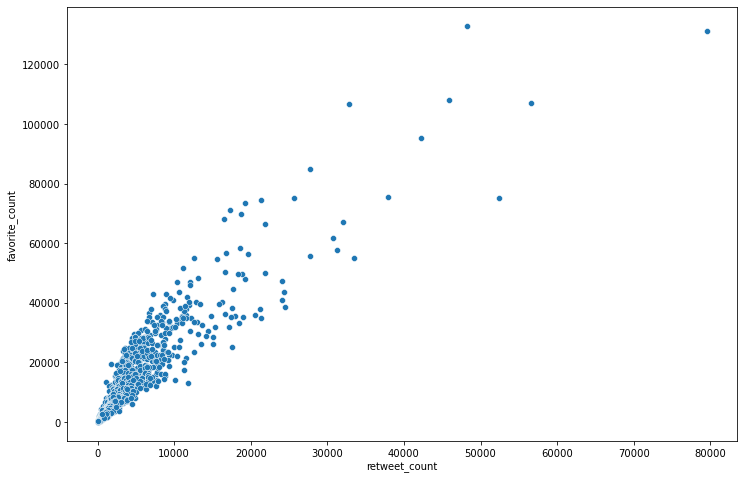

In [205]:
#let's look at correlation between retweet_count and favorite_count as a scatter plot
import seaborn as sns
fig, ax = plt.subplots(figsize=(12,8))
sns.scatterplot(data=df_merged, x='retweet_count', y='favorite_count')
plt.show();

#### Again, there is a strong correlation between retweet_count and favorite_count.

### Second question: What the trend of mean favorite and retweet counts over time?

In [206]:
#create a column of year/month so we can look at data over time
df_merged['yr_month'] = df_merged['timestamp'].apply(lambda x: x.strftime('%Y-%m')) 


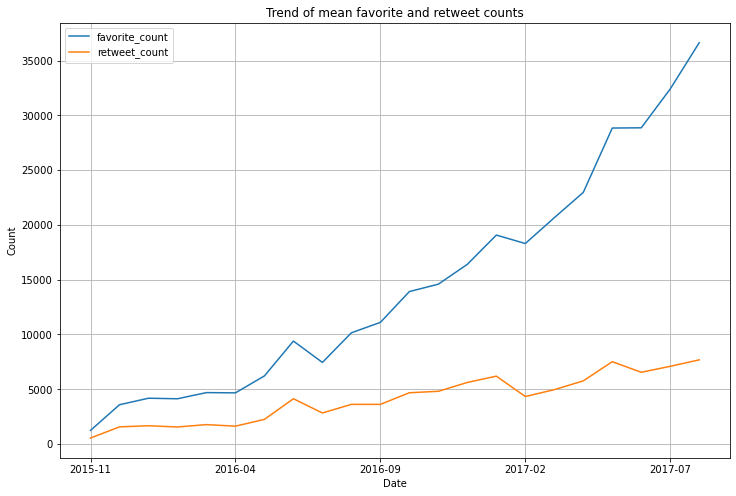

In [207]:
data = df_merged.groupby(["yr_month"]).mean()[["favorite_count", "retweet_count"]] #create groupby object by release year that sums the individual genres
ax = data.plot(kind='line',
               title="Trend of mean favorite and retweet counts",
               figsize = (12,8), grid=True)
ax.set(xlabel='Date', ylabel='Count'); 

#### While both mean retweet_count and mean favorite_count have increased over time, favorite_count has increased significantly more.

### Third question: For the dogs who were tweeted with names, what were the 10 most popular names?

In [208]:
top10names = df_merged[df_merged["name"]!="None"]["name"].value_counts().head(10).sort_values()
top10names

Daisy       7
Winston     8
Lola        8
Sadie       8
Tucker      9
Penny       9
Oliver     10
Cooper     10
Charlie    11
Lucy       11
Name: name, dtype: int64

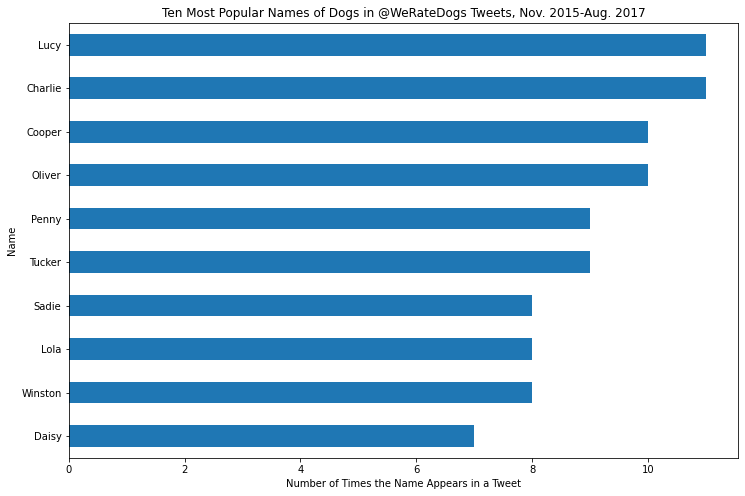

In [209]:
#let's visualize this
plt.title("Ten Most Popular Names of Dogs in @WeRateDogs Tweets, Nov. 2015-Aug. 2017")
plt.xlabel("Number of Times the Name Appears in a Tweet")
plt.ylabel("Name")
top10names.plot.barh(figsize=(12, 8));

### Fourth question: What were the 10 most common dog breeds predicted from all three predictions?

In [210]:
#what are the algorithm's top 10 No. 1 predictions 
image_pred_clean["num1pred"].value_counts().head(10) 

golden_retriever      150
Labrador_retriever    100
Pembroke               89
Chihuahua              83
pug                    57
chow                   44
Samoyed                43
toy_poodle             39
Pomeranian             38
malamute               30
Name: num1pred, dtype: int64

In [211]:
image_pred_clean["num2pred"].value_counts().head(10)

Labrador_retriever          104
golden_retriever             92
Cardigan                     73
Chihuahua                    44
Pomeranian                   42
French_bulldog               41
Chesapeake_Bay_retriever     41
toy_poodle                   37
cocker_spaniel               34
miniature_poodle             33
Name: num2pred, dtype: int64

In [212]:
image_pred_clean["num3pred"].value_counts().head(10)

Labrador_retriever           79
Chihuahua                    58
golden_retriever             48
Eskimo_dog                   38
kelpie                       35
kuvasz                       34
chow                         32
Staffordshire_bullterrier    32
cocker_spaniel               31
beagle                       31
Name: num3pred, dtype: int64

#### Let's find out the total breed count from all three predictions.  

In [213]:
#create a list of all dogs predicted in 1st, 2nd and 3rd predictions

In [214]:
list1 = image_pred_clean.loc[image_pred_clean['num1pred_dog'] == True, 'num1pred'].to_list()

In [215]:
list2 = image_pred_clean.loc[image_pred_clean['num2pred_dog'] == True, 'num2pred'].to_list()

In [216]:
list3 = image_pred_clean.loc[image_pred_clean['num3pred_dog'] == True, 'num3pred'].to_list()

In [217]:
list_dogs = list1+list2+list3 

In [218]:
len(list_dogs) #how long is the list

4584

In [219]:
set_dogs = set(list_dogs) #removing duplicate entries using set

In [220]:
set_dogs #what is in the set of breeds

{'Afghan_hound',
 'Airedale',
 'American_Staffordshire_terrier',
 'Appenzeller',
 'Australian_terrier',
 'Bedlington_terrier',
 'Bernese_mountain_dog',
 'Blenheim_spaniel',
 'Border_collie',
 'Border_terrier',
 'Boston_bull',
 'Bouvier_des_Flandres',
 'Brabancon_griffon',
 'Brittany_spaniel',
 'Cardigan',
 'Chesapeake_Bay_retriever',
 'Chihuahua',
 'Dandie_Dinmont',
 'Doberman',
 'English_foxhound',
 'English_setter',
 'English_springer',
 'EntleBucher',
 'Eskimo_dog',
 'French_bulldog',
 'German_shepherd',
 'German_short-haired_pointer',
 'Gordon_setter',
 'Great_Dane',
 'Great_Pyrenees',
 'Greater_Swiss_Mountain_dog',
 'Ibizan_hound',
 'Irish_setter',
 'Irish_terrier',
 'Irish_water_spaniel',
 'Irish_wolfhound',
 'Italian_greyhound',
 'Japanese_spaniel',
 'Kerry_blue_terrier',
 'Labrador_retriever',
 'Lakeland_terrier',
 'Leonberg',
 'Lhasa',
 'Maltese_dog',
 'Mexican_hairless',
 'Newfoundland',
 'Norfolk_terrier',
 'Norwegian_elkhound',
 'Norwich_terrier',
 'Old_English_sheepdog',
 

In [221]:
len(set_dogs) #how many individual breeds of dogs does the algorithm name?

118

In [222]:
#count the number of predictions per breed, find the top 10
from collections import Counter
top10dog_count = Counter(list_dogs).most_common(10)
top10dog_count

[('golden_retriever', 290),
 ('Labrador_retriever', 283),
 ('Chihuahua', 185),
 ('Pembroke', 143),
 ('Cardigan', 115),
 ('Pomeranian', 109),
 ('toy_poodle', 105),
 ('pug', 97),
 ('chow', 96),
 ('cocker_spaniel', 95)]

In [223]:
#create two lists (breeds and their counts (values)) and plot the lists
breeds = [x[0] for x in top10dog_count] 
values = [x[1] for x in top10dog_count]
ind = np.arange(len(top10dog_count))  # the x locations for the groups
width = 0.35       # the width of the bars

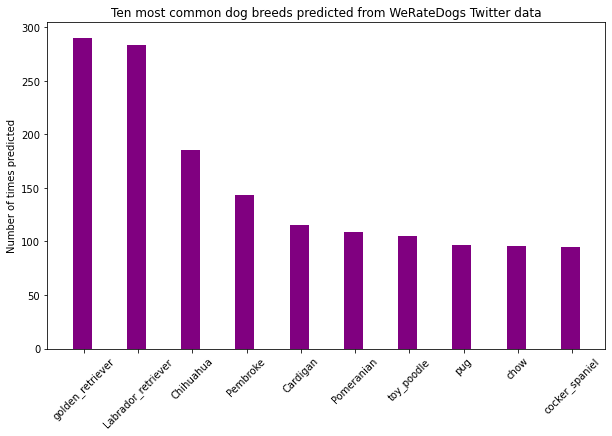

In [224]:
#let's visualize this
fig, ax = plt.subplots(figsize=(10,6))
rects1 = ax.bar(ind, values, width, color='purple')

# add some text for labels, title and axes ticks
ax.set_title('Ten most common dog breeds predicted from WeRateDogs Twitter data')
ax.set_ylabel('Number of times predicted')

ax.set_xticks(ind+width/12)
ax.set_xticklabels(breeds, rotation = 45);

#### Out of all of the predictions in image_pred_clean, the top 10 dog breeds predicted include some of the most popular dogs in the U.S., including the golden retriever and the Labrador retriever. 

### Fifth question: Which tweet got the highest number of retweets? The highest number of favorites?

In [225]:
#examining the tweet with highest number of retweets, which is a video clip of a dog in a pool.
df_merged[df_merged["retweet_count"]==df_merged["retweet_count"].max()]

,tweet_id,timestamp,tweet,short_url,retweet_count,favorite_count,rating_numerator,rating_denominator,name,stage,yr_month
823,744234799360020481,2016-06-18 18:26:18+00:00,Here's a doggo realizing you can stand in a pool. 13/10 enlightened af (vid by Tina Conrad),https://t.co/7wE9LTEXC4,79515,131075,13.0,10.0,None,doggo,2016-06


In [226]:
#examining the tweet with the highest number of favorites, which is a dog at the Women's March
df_merged[df_merged["favorite_count"]==df_merged["favorite_count"].max()]

,tweet_id,timestamp,tweet,short_url,retweet_count,favorite_count,rating_numerator,rating_denominator,name,stage,yr_month
324,822872901745569793,2017-01-21 18:26:02+00:00,Here's a super supportive puppo participating in the Toronto #WomensMarch today. 13/10,https://t.co/nTz3FtorBc,48265,132810,13.0,10.0,None,puppo,2017-01


### Saving the DataFrames as a .csv files

In [227]:
df_merged.to_csv('twitter_archive_master.csv', index=False)


In [228]:
image_pred_clean.to_csv('image_pred_clean.csv', index=False)

<a id='conclusions'></a>
## Conclusions

### Despite the relatively small size of the datasets, I was able to glean a few insights. 

First, favorited tweets increased more quickly than retweeted tweets in the nearly two years since the WeRateDogs Twitter account was started in November 2015. This indicates that followers of this account are more likely to "like" a tweet than to "retweet" it. Knowing this could guide WeRateDogs to alter its social media strategy to "maximize the number of retweets each post receives to connect with a broader audience beyond immediate followers." (see https://medium.com/@Encore/favorites-vs-retweets-and-why-one-is-more-important-than-the-other-ba12ee20e9ba). The fact that the tweet with the highest number of retweets is a video clip of a dog in a pool suggests that to increase the number of retweets, WeRateDogs might want to tweet more video clips. 

Second, No. 1 most predicted dog breed was the golden retriever, which is one of the most popular dogs in the U.S. according to the American Kennel Club. Without knowing more about the algorithm, it's unclear if some self-selection is going on in photos submitted or selected.  

Third, the most common names for the dogs that were tweeted with a name, were Charlie and Lucy. 

Ideally, I would have a larger dataset over a longer time period, and if the eventual goal was to provide recommendations for WeRateDogs' social media strategy, to also look at its Instagram and Facebook data.